In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore', category=UserWarning, module='IPython.core.pylabtools')

import textwrap

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [2]:
sample_size = 200

# Data Loading and Cleaning

In [3]:
# load pre-aggregation features
pre_agg = pd.read_csv(f'../results/pre-aggregation/liwcANDfeatures_results_{sample_size}.csv.gzip', compression='gzip')
pre_agg['final_message_string'] = pre_agg['final_message_string'].astype(str)

In [4]:
#assign sentiment column
pre_agg['sentiment'] = np.where(pre_agg['positive_sentiment'] == 1, 'positive', np.where(pre_agg['negative_sentiment'] == 1, 'negative', 'neutral'))

In [5]:
plotting = pre_agg[pre_agg['own_message'] == 1]

In [6]:
# load aggregated per author df
post_agg_author = pd.read_csv(f'../results/post-aggregation/author_{sample_size}.csv.gzip', compression='gzip')
#only keep rows of post_agg_author where own_message + forwarded_message is 1
post_agg_author = post_agg_author[post_agg_author['own_message'] + post_agg_author['forwarded_message'] == 1]

In [7]:
#load aggregated per author and date df
author_date = pd.read_csv(f'../results/post-aggregation/author_date_{sample_size}.csv.gzip', compression='gzip')
author_date['date'] = pd.to_datetime(author_date['date'])

In [8]:
# load aggregated per author and group df
author_group = pd.read_csv(f'../results/post-aggregation/author_group_{sample_size}.csv.gzip', compression='gzip')
# otherwise plt doesn't recognize unique values
author_group['group_name'] = author_group['group_name'].str.strip().str.lower()

In [9]:
post_agg_author.columns

Index(['author', 'noun_count', 'verb_count', 'adj_count', 'positive_sentiment',
       'negative_sentiment', 'neutral_sentiment', 'channel_messages',
       'group_messages', 'sent_count', 'word_count', 'avg_sent_length',
       'avg_word_length', 'exclamation_count', 'question_count', 'emoji_count',
       'flesch_reading_ease', 'liwc_I', 'liwc_We', 'liwc_You', 'liwc_Other',
       'liwc_Affect', 'final_message', 'final_message_string', 'own_message',
       'forwarded_message', 'total_message_count', 'own_message_count',
       'forwarded_message_count', 'action_quotient', 'sentiment_quotient',
       'avg_flesch_reading_ease_class', 'toxicity'],
      dtype='object')

In [10]:
#put all features to be plotted in one list
features = post_agg_author.columns[1:-10].append(post_agg_author.columns[-8:-6].append(post_agg_author.columns[-5:-3].append(post_agg_author.columns[-1:])))
features

Index(['noun_count', 'verb_count', 'adj_count', 'positive_sentiment',
       'negative_sentiment', 'neutral_sentiment', 'channel_messages',
       'group_messages', 'sent_count', 'word_count', 'avg_sent_length',
       'avg_word_length', 'exclamation_count', 'question_count', 'emoji_count',
       'flesch_reading_ease', 'liwc_I', 'liwc_We', 'liwc_You', 'liwc_Other',
       'liwc_Affect', 'final_message', 'forwarded_message',
       'total_message_count', 'forwarded_message_count', 'action_quotient',
       'toxicity'],
      dtype='object')

# Post-Aggregation Features over Time

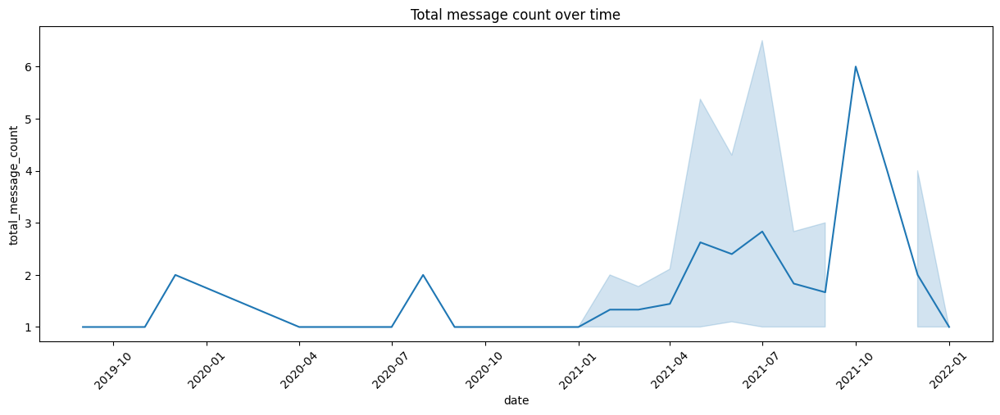

In [11]:
# message counts
plt.figure(figsize=(15, 5))
sns.lineplot(data=author_date, x='date', y='total_message_count', sort=True)
plt.xticks(rotation=45)
plt.title(f'Total message count over time')
plt.show()

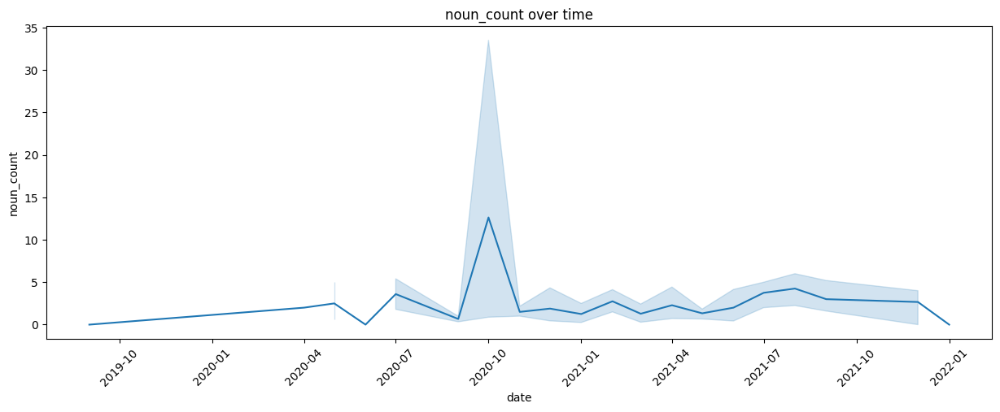

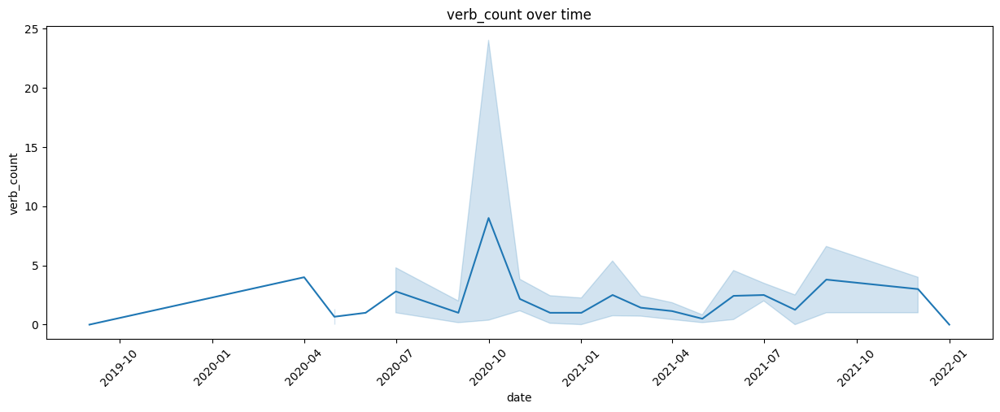

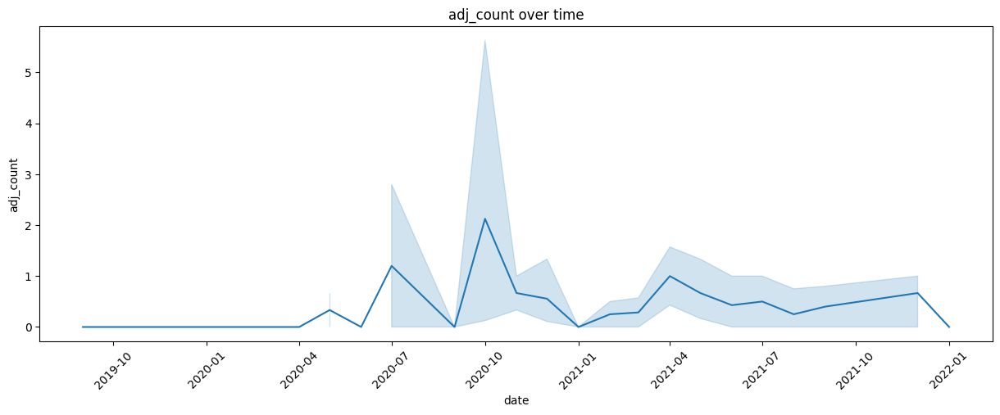

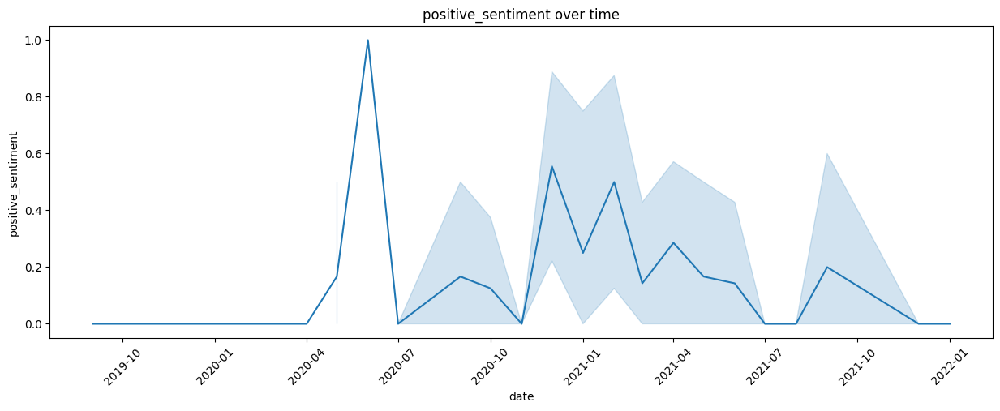

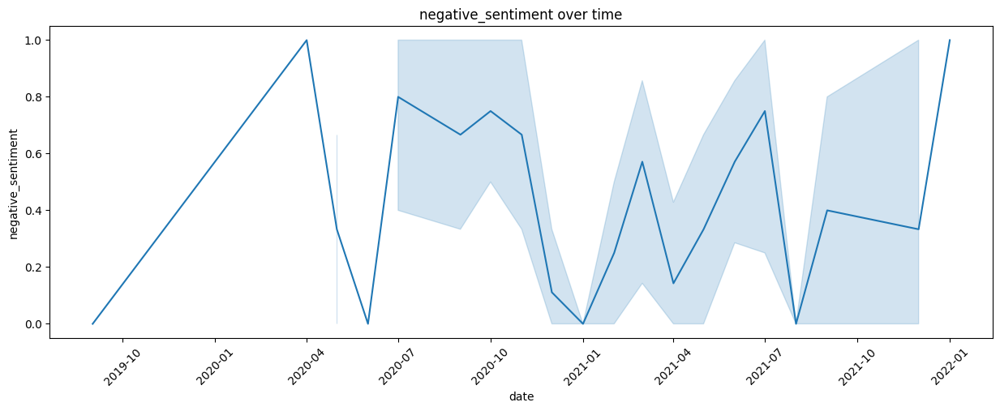

...

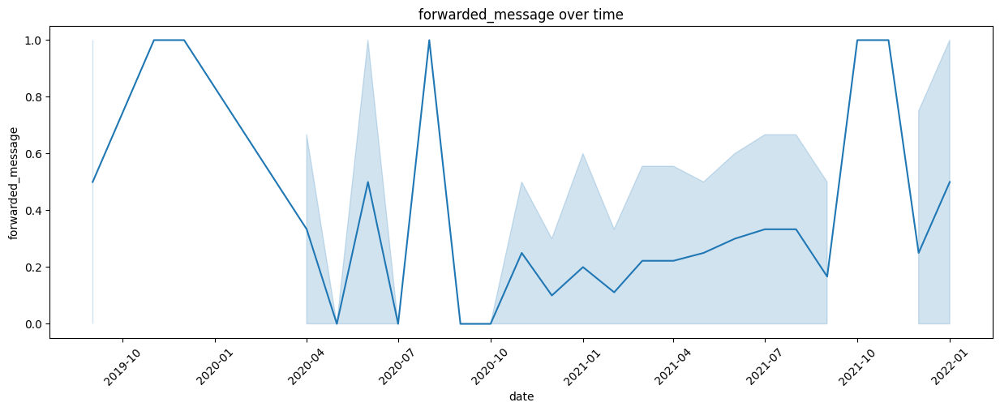

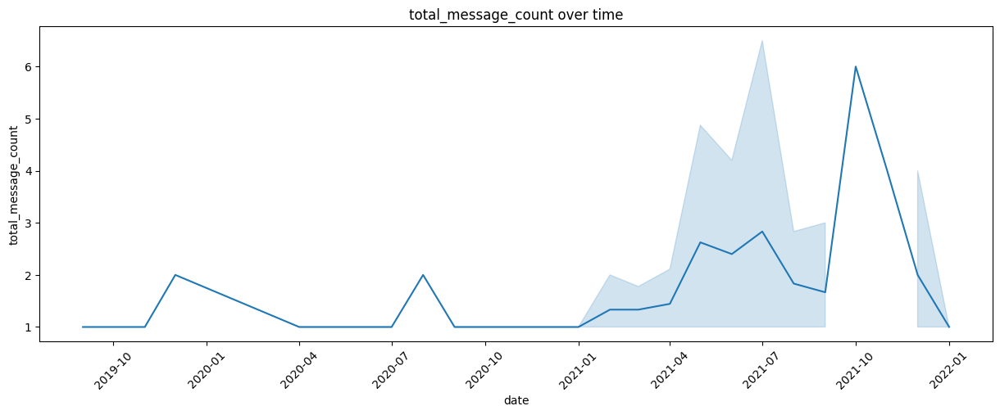

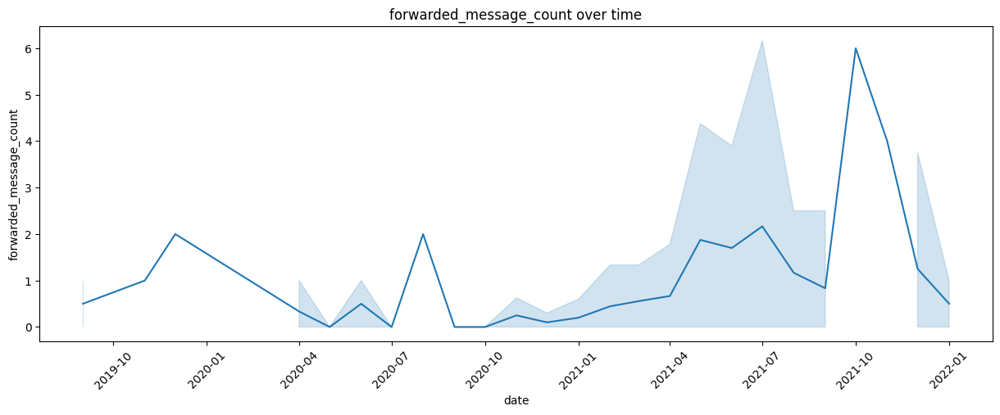

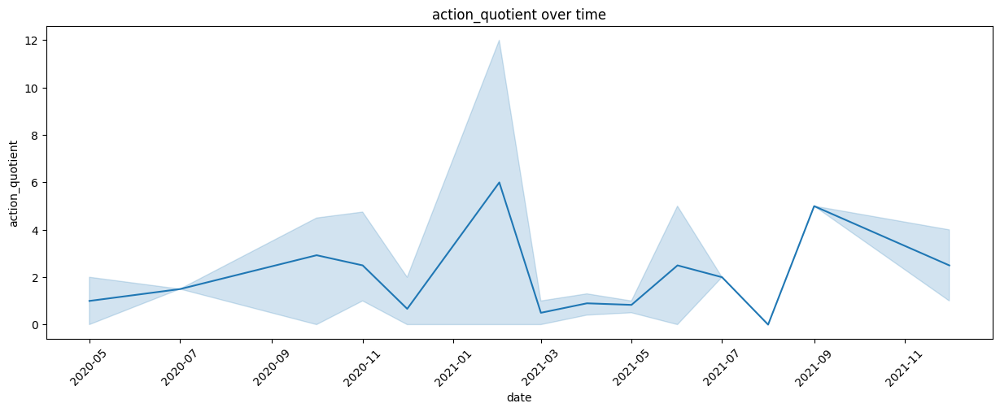

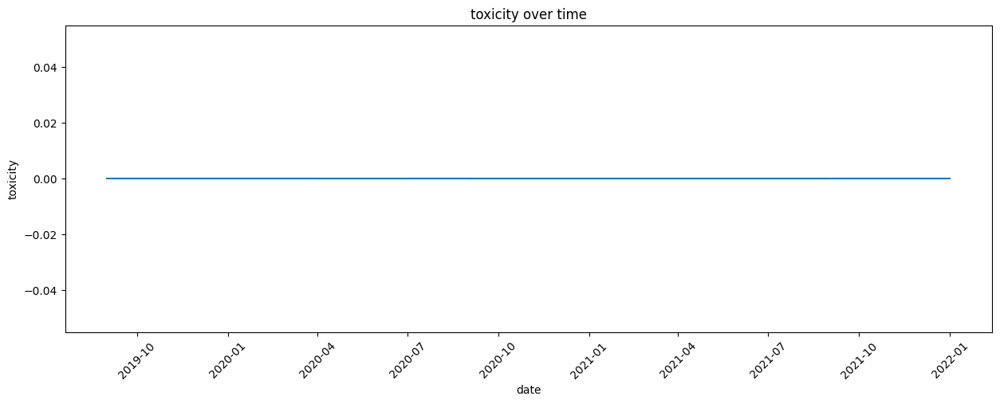

In [12]:
# avg of all features over time
for col in features:
    plt.figure(figsize=(15, 5))
    sns.lineplot(data=author_date, x='date', y=col, sort=True)
    plt.xticks(rotation=45)
    plt.title(f'{col} over time')
    plt.show()

# Post-Aggregation Features per Group

## All Groups

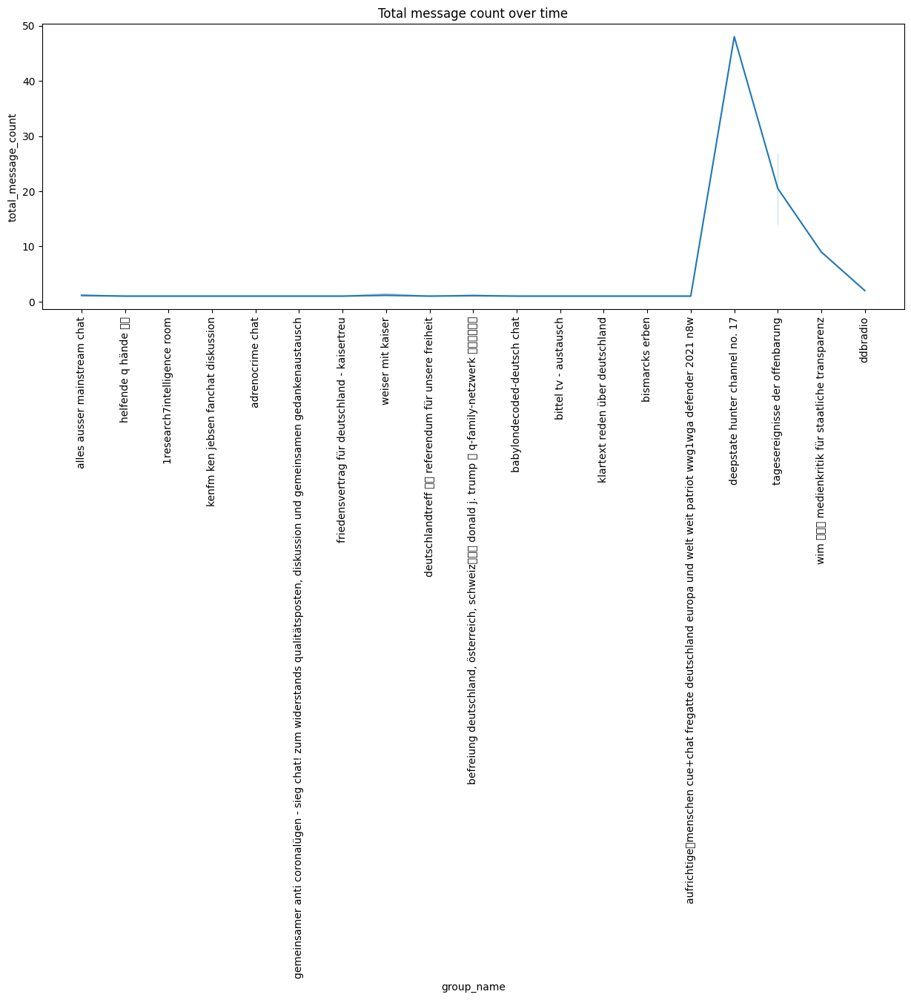

In [13]:
# message counts
plt.figure(figsize=(15, 5))
sns.lineplot(data=author_group, x='group_name', y='total_message_count', sort=True)
plt.xticks(rotation=90)
plt.title(f'Total message count over time')
plt.show()

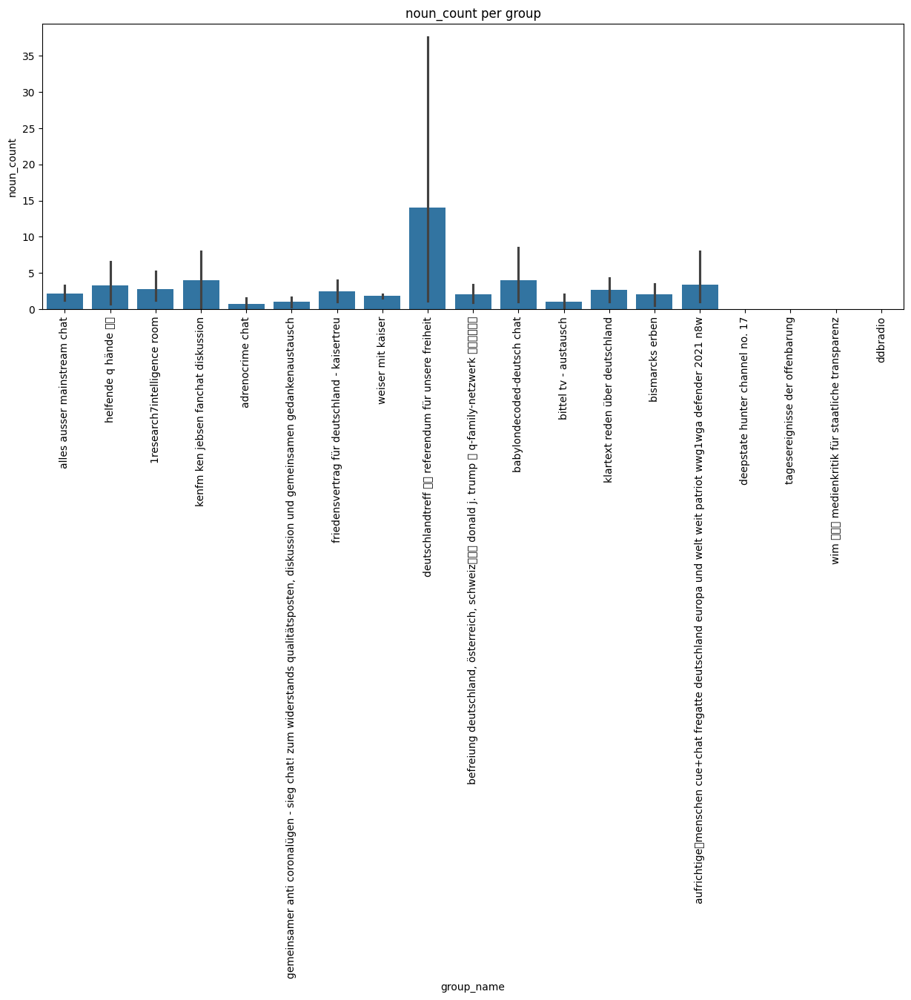

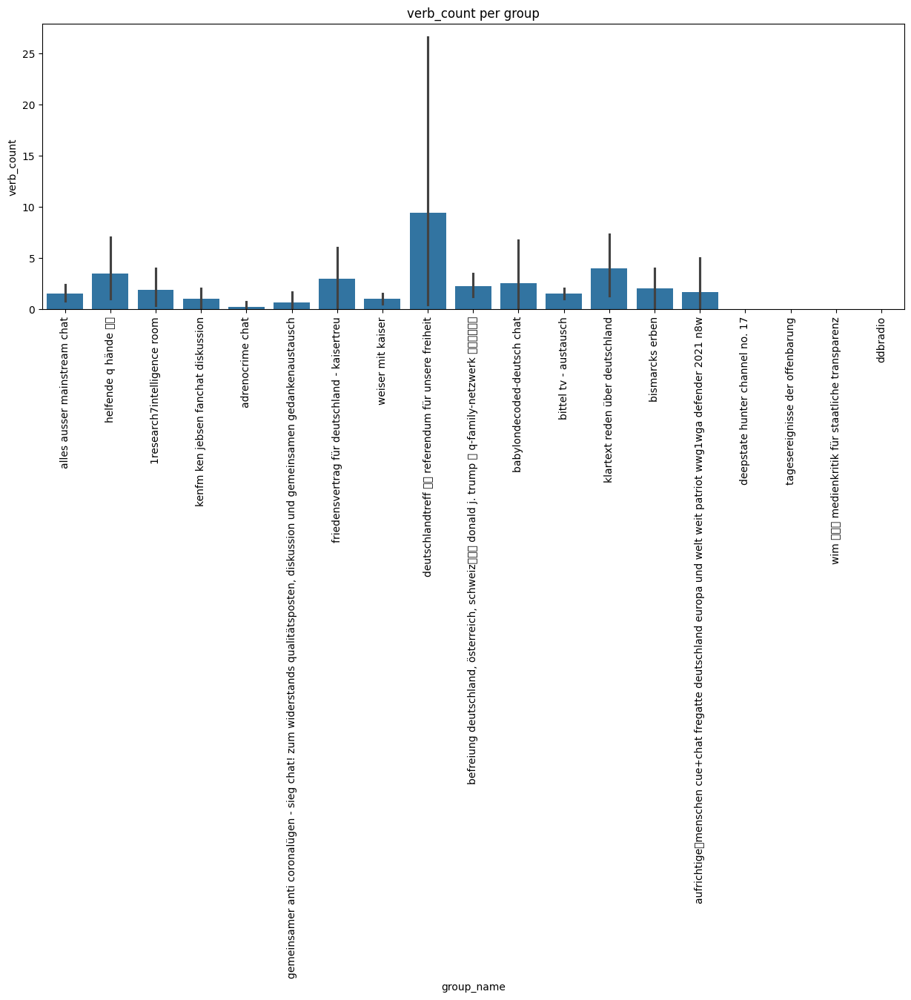

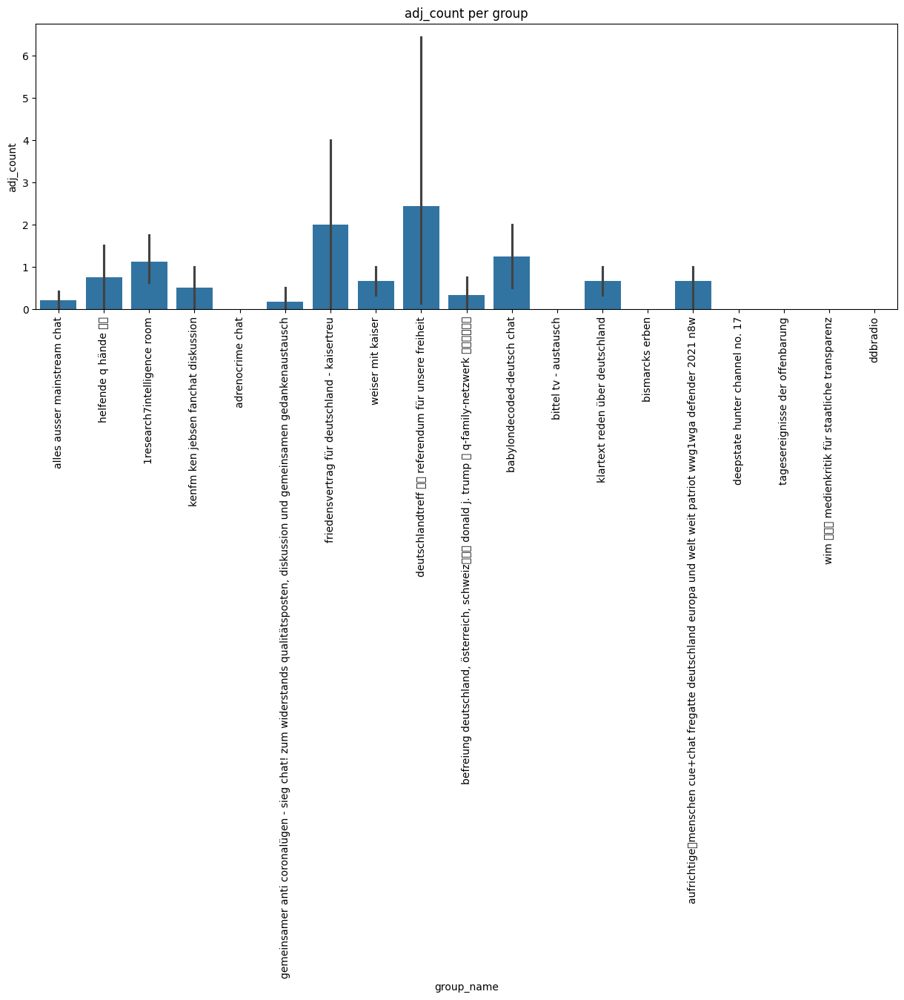

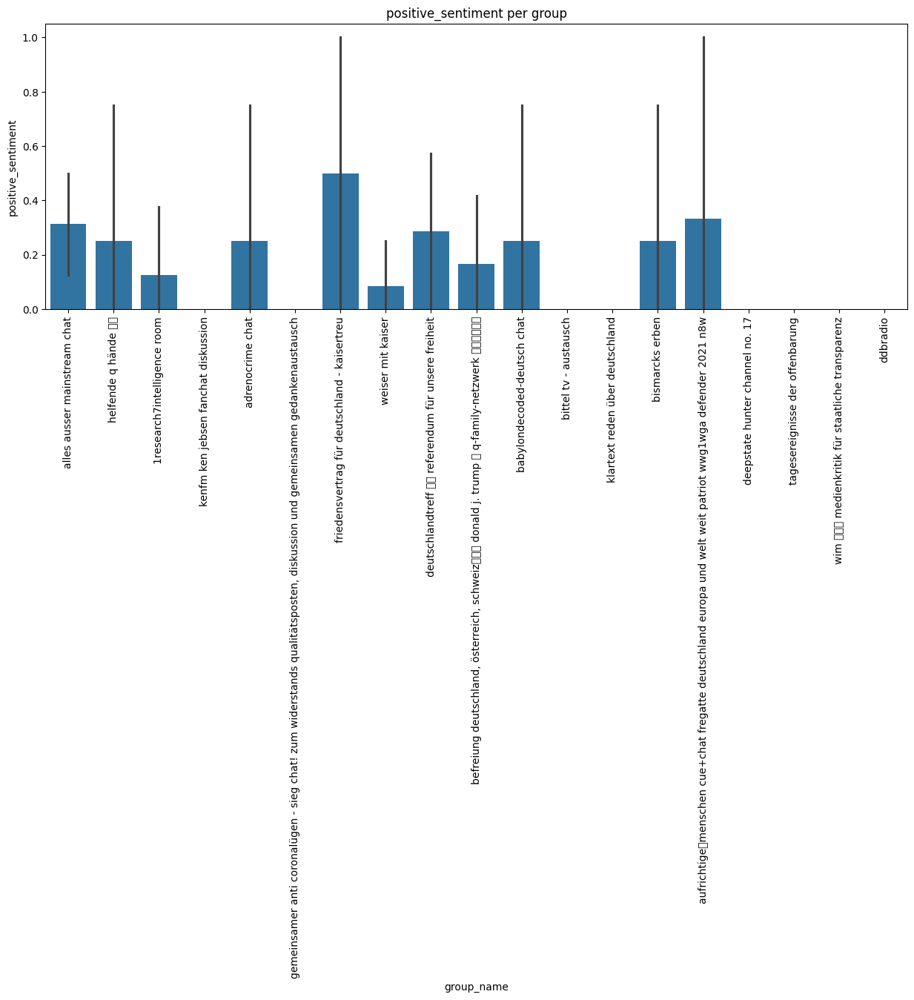

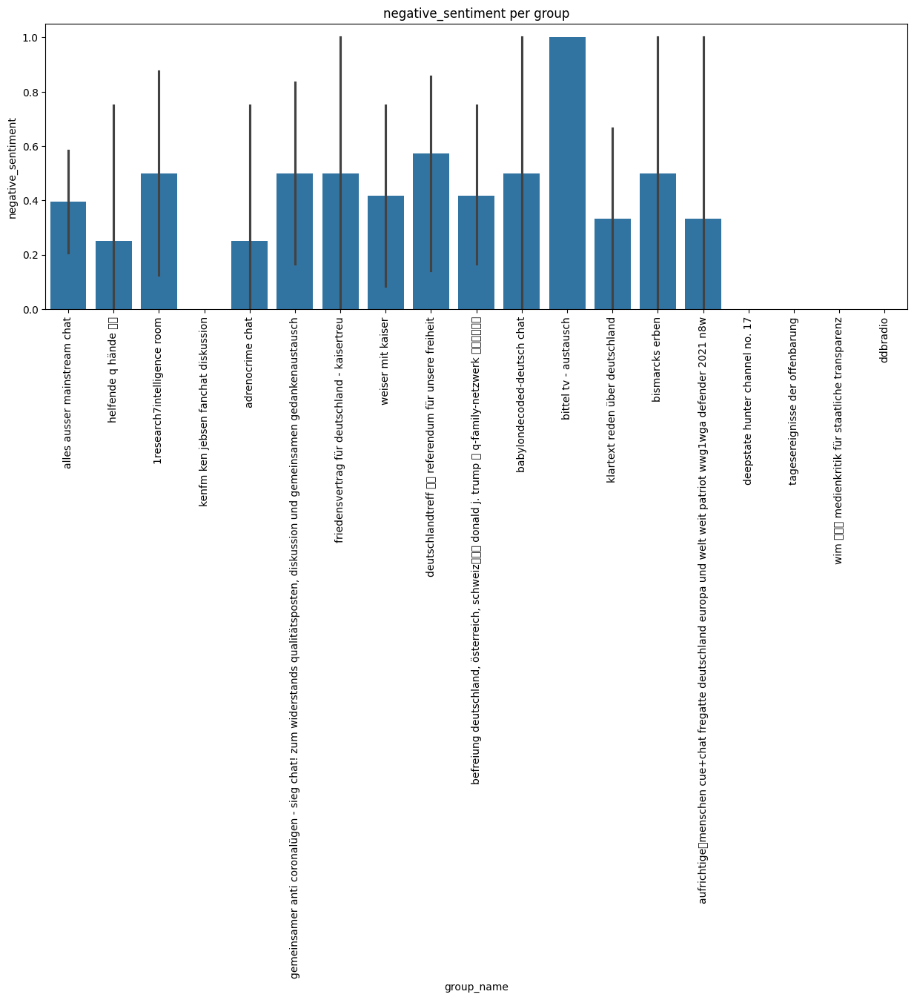

...

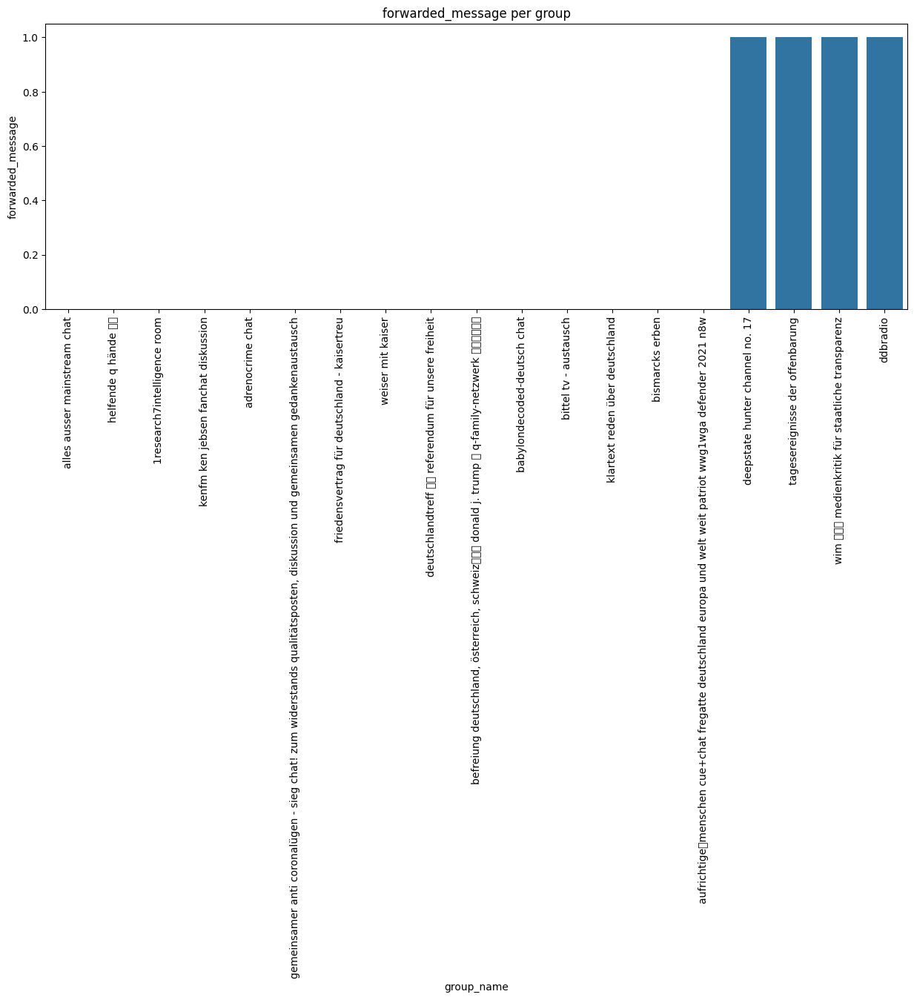

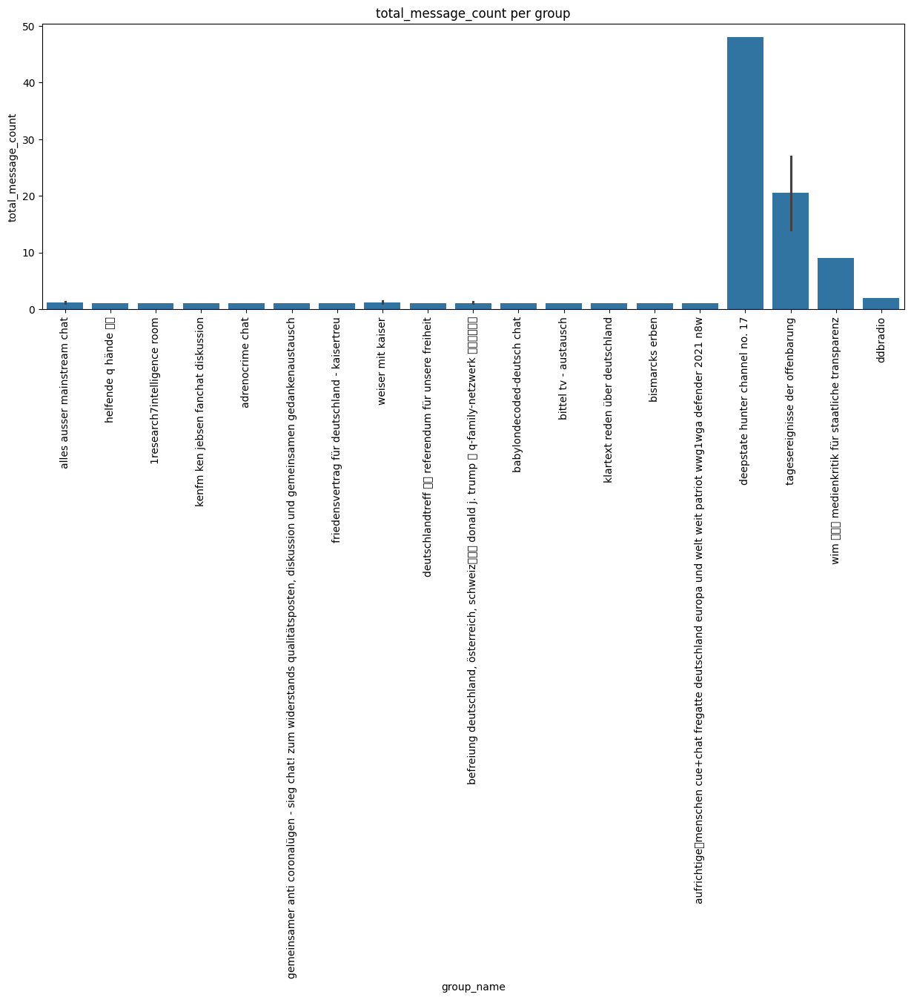

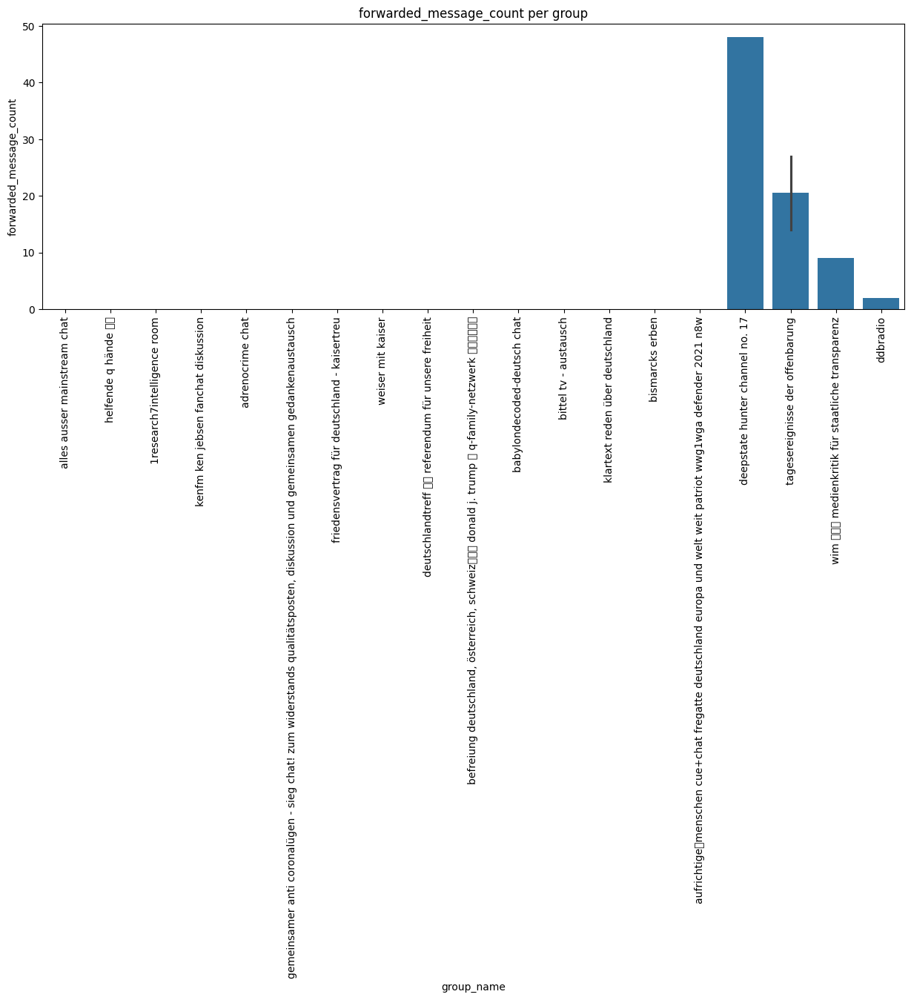

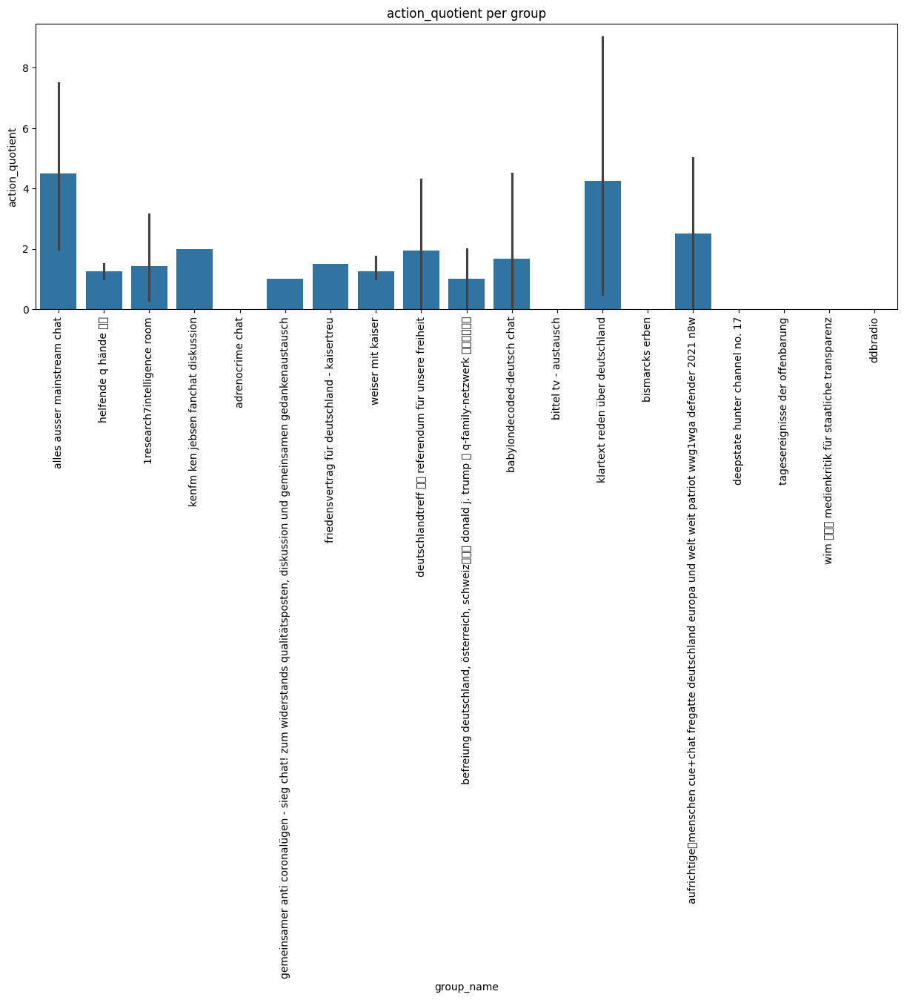

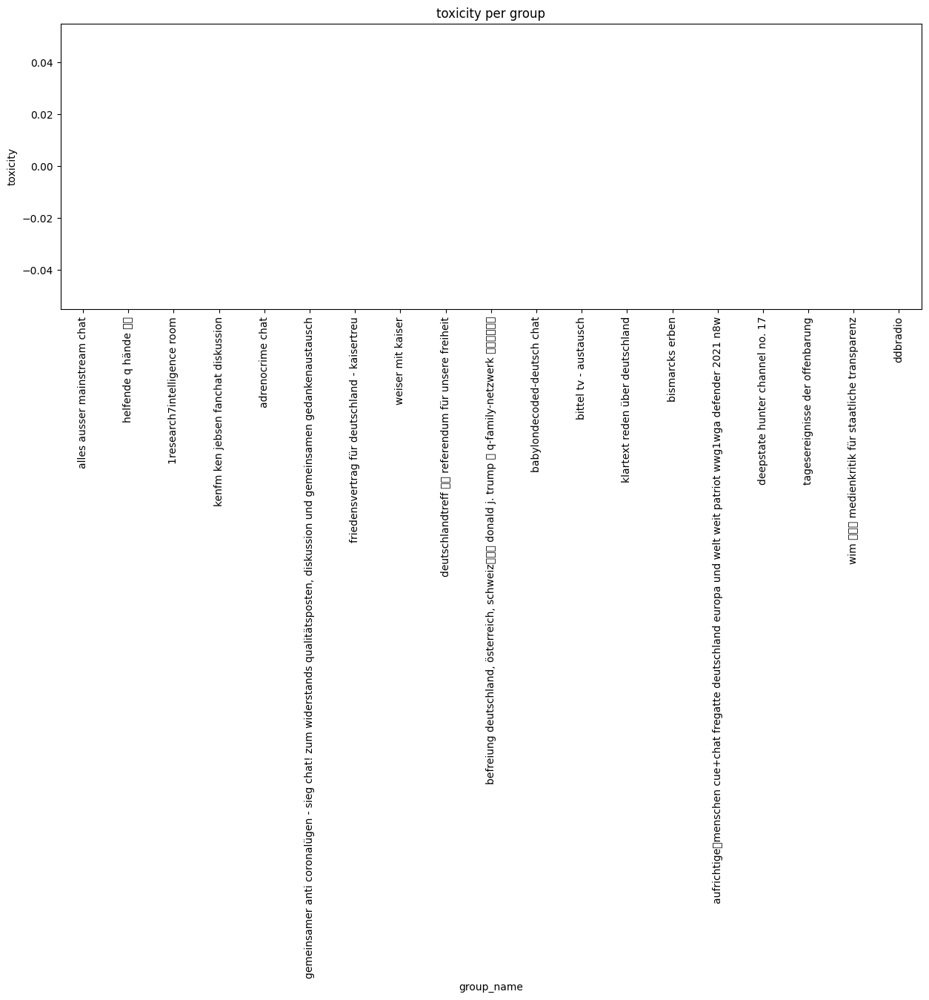

In [14]:
#plot avg of columns per group
for col in features:
    plt.figure(figsize=(15, 5))
    sns.barplot(data=author_group, x='group_name', y=col)
    plt.xticks(rotation=90)
    plt.title(f'{col} per group')
    plt.show()

## Selected Subset of Groups

In [15]:
author_group.group_name.unique()

array(['alles ausser mainstream chat', 'helfende q hände 👐👏',
       '1research7intelligence room',
       'kenfm ken jebsen fanchat diskussion', 'adrenocrime chat',
       'gemeinsamer anti coronalügen - sieg chat! zum widerstands qualitätsposten, diskussion und gemeinsamen gedankenaustausch',
       'friedensvertrag für deutschland - kaisertreu',
       'weiser mit kaiser',
       'deutschlandtreff 🇩🇪 referendum für unsere freiheit',
       'befreiung deutschland, österreich, schweiz💃🕺💃 donald j. trump 🐇 q-family-netzwerk 🇩🇪🇦🇹🇨🇭',
       'babylondecoded-deutsch chat', 'bittel tv - austausch',
       'klartext reden über deutschland', 'bismarcks erben',
       'aufrichtige💚menschen cue+chat fregatte deutschland europa und welt weit patriot wwg1wga defender 2021 n8w',
       'deepstate hunter channel no. 17',
       'tagesereignisse der offenbarung',
       'wim 📈🏛📣 medienkritik für staatliche transparenz', 'ddbradio'],
      dtype=object)

In [16]:
#create subset of seletced groups
group_selection = ['tagesereignisse der offenbarung', '📌german chemtrail watchers chat', 'helfende q hände 👐👏', 'babylondecoded-deutsch chat',
'gemeinsamer anti coronalügen - sieg chat! zum widerstands qualitätsposten, diskussion und gemeinsamen gedankenaustausch',
'du bist reichsbürger! - das weiß auch der bundestag im reichstag!','adrenochrom diskussion']

selected_groups = author_group[author_group['group_name'].isin(group_selection)]

In [17]:
selected_groups = selected_groups[selected_groups['own_message'] ==1]

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


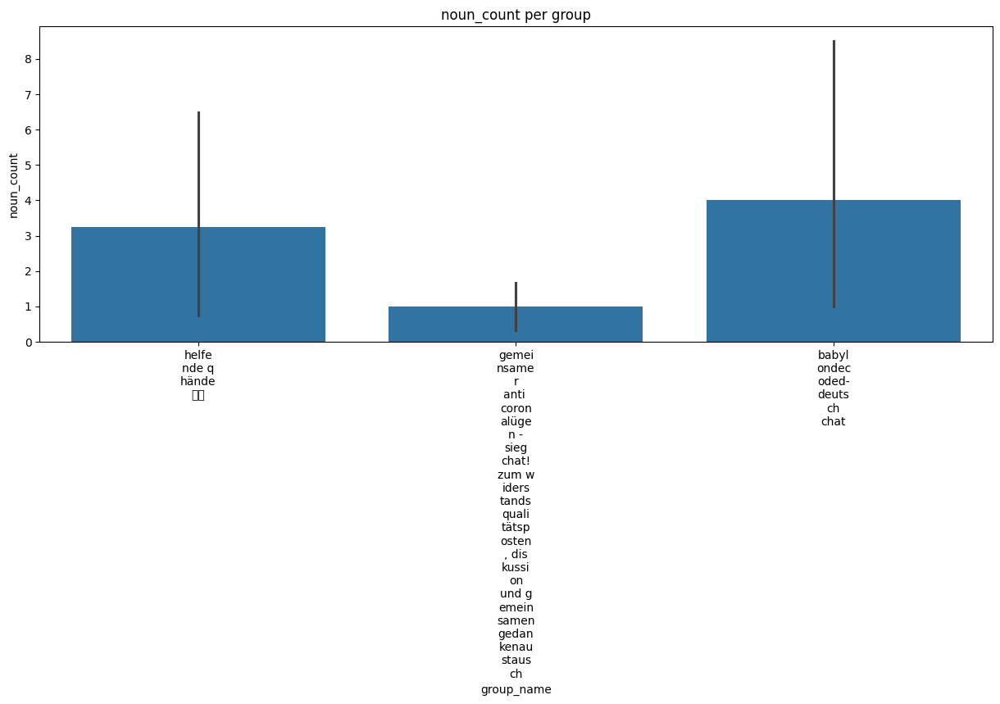

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


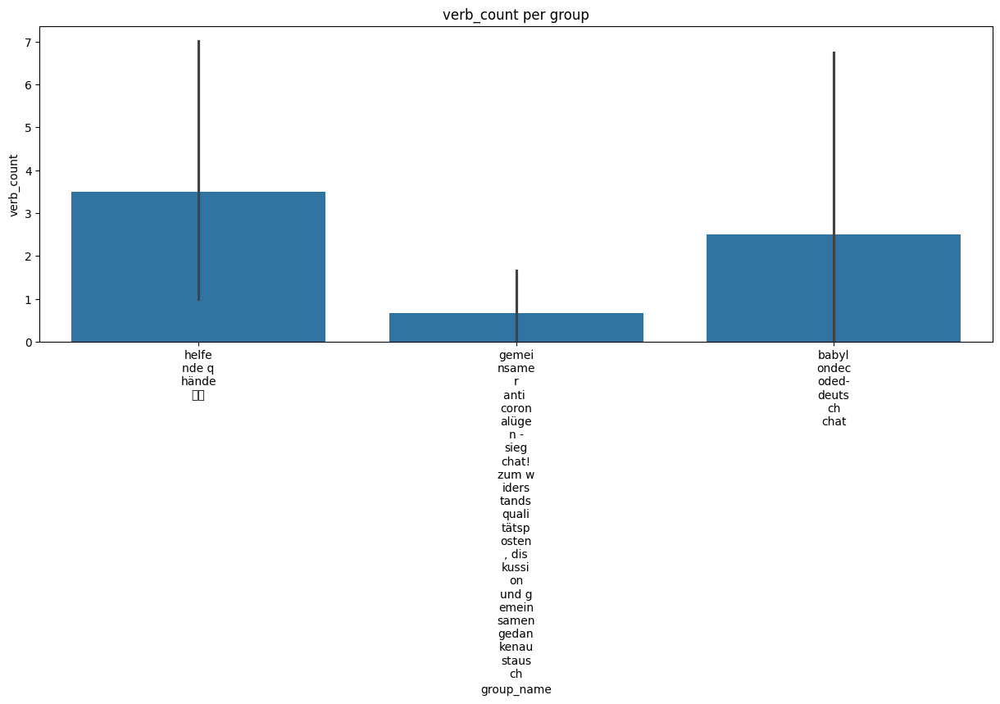

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


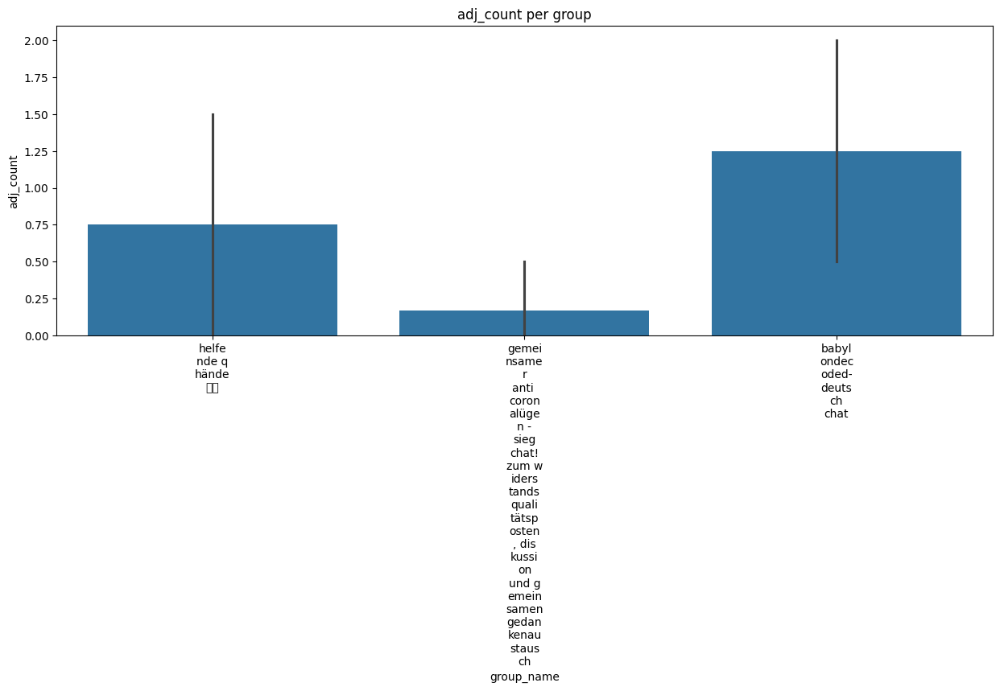

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


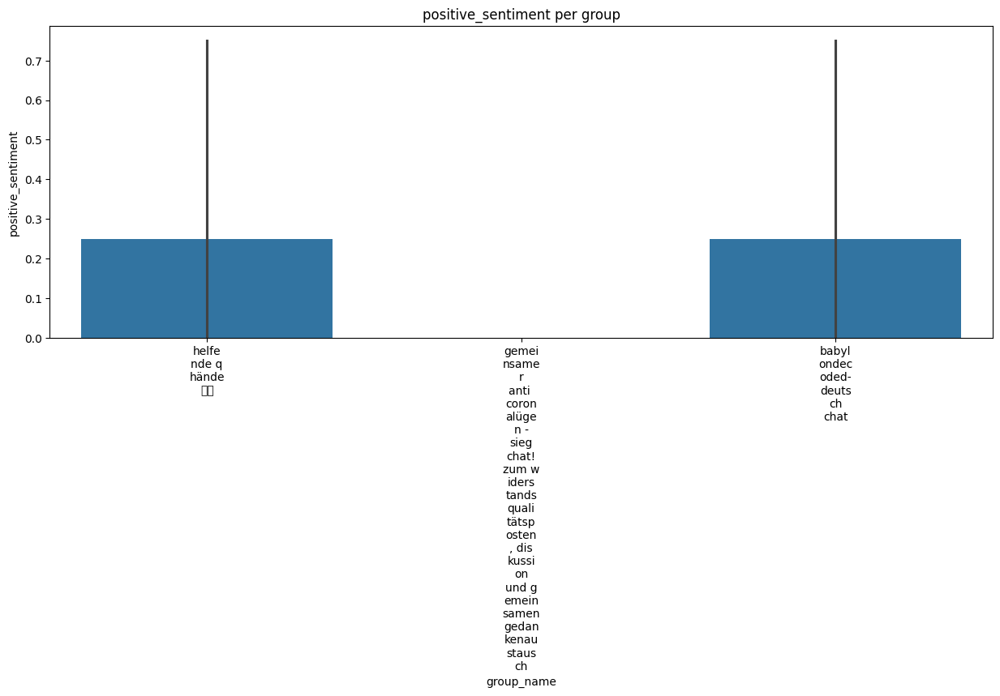

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


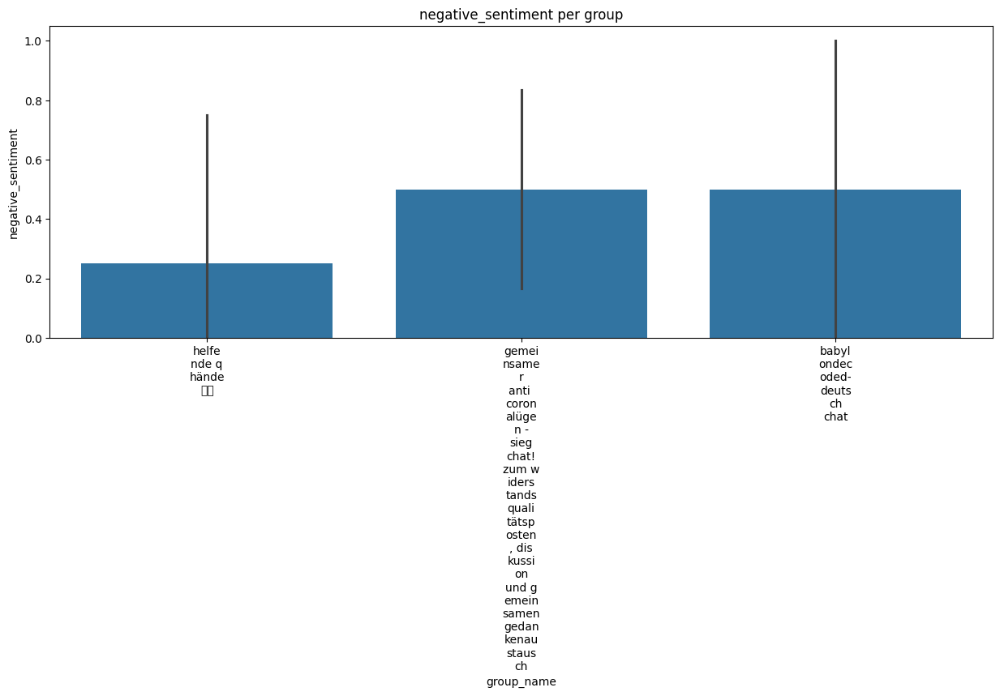

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


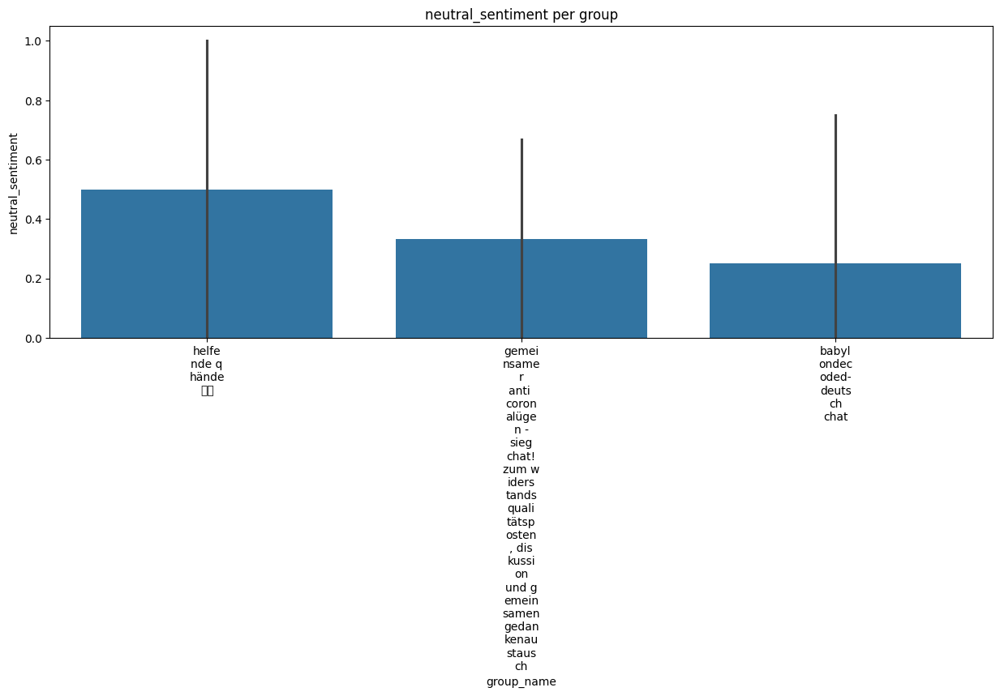

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


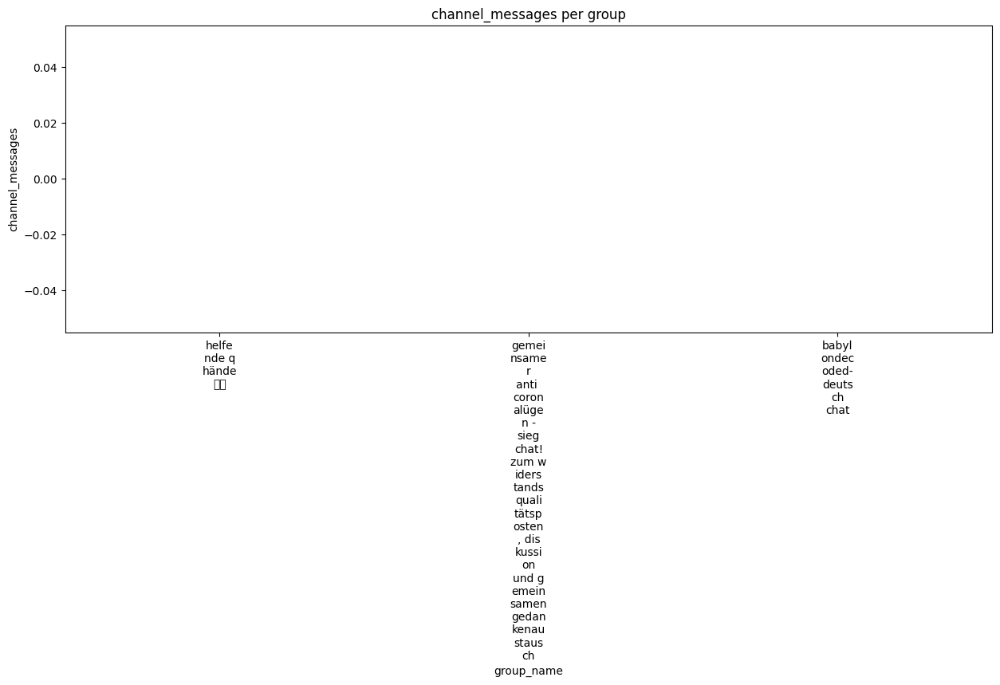

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


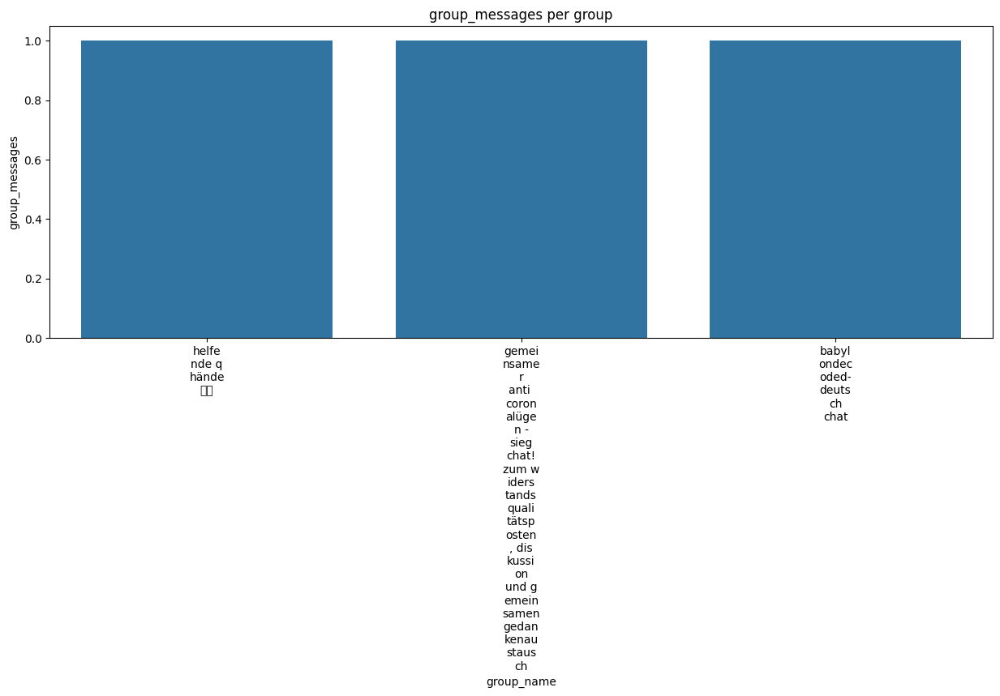

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


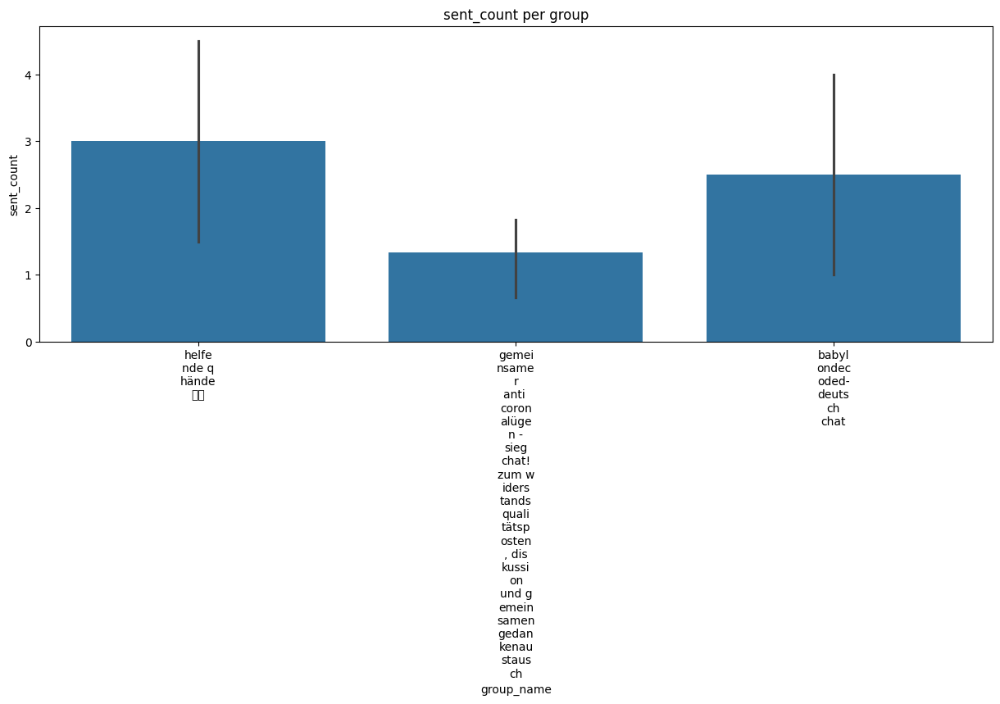

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


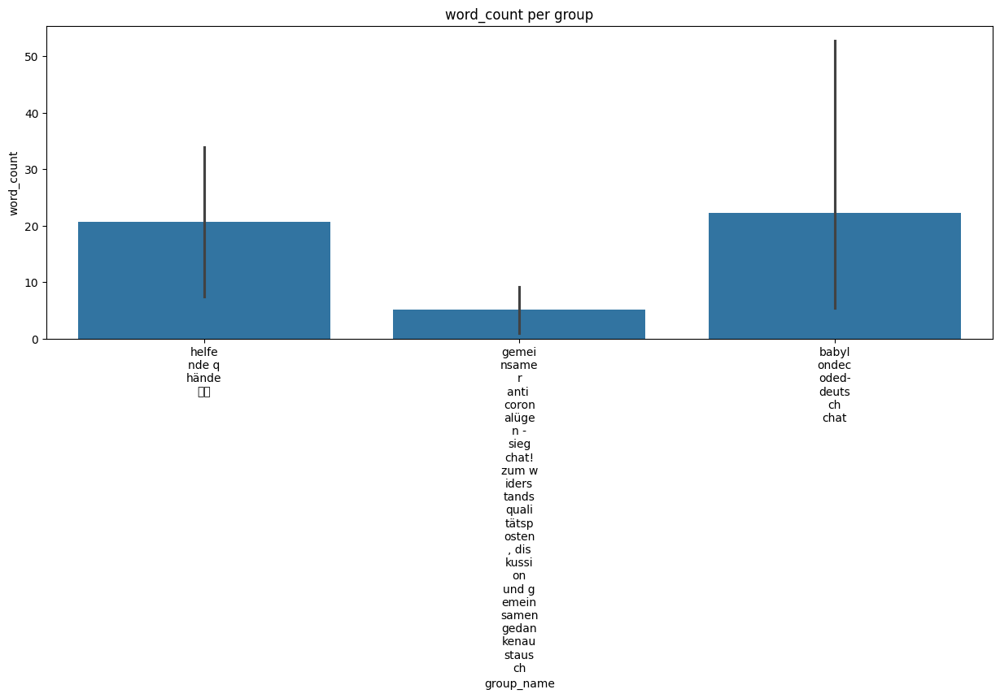

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


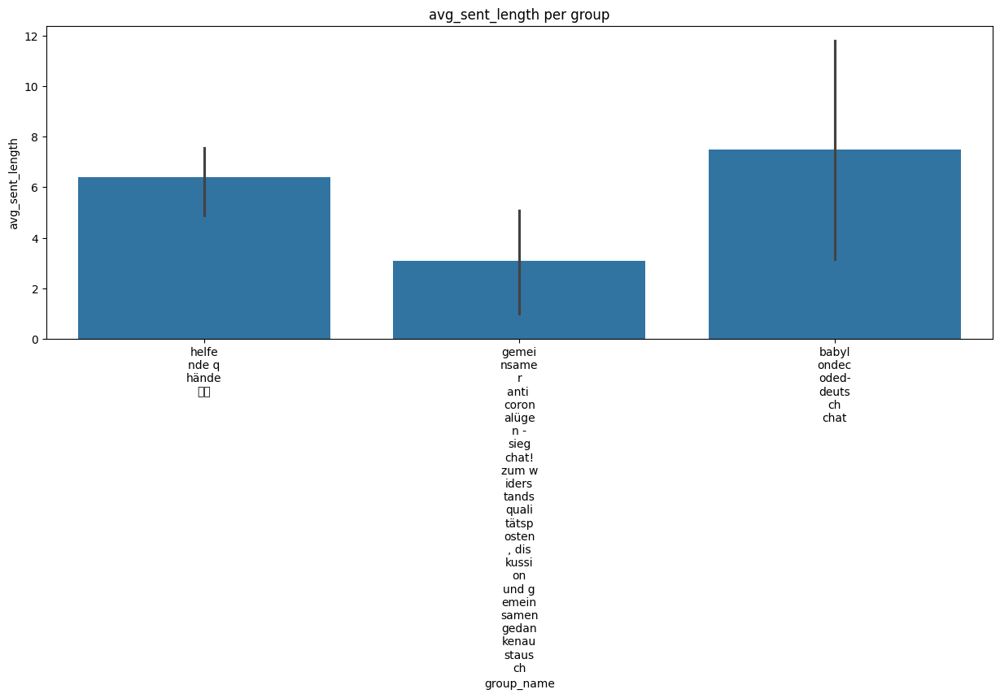

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


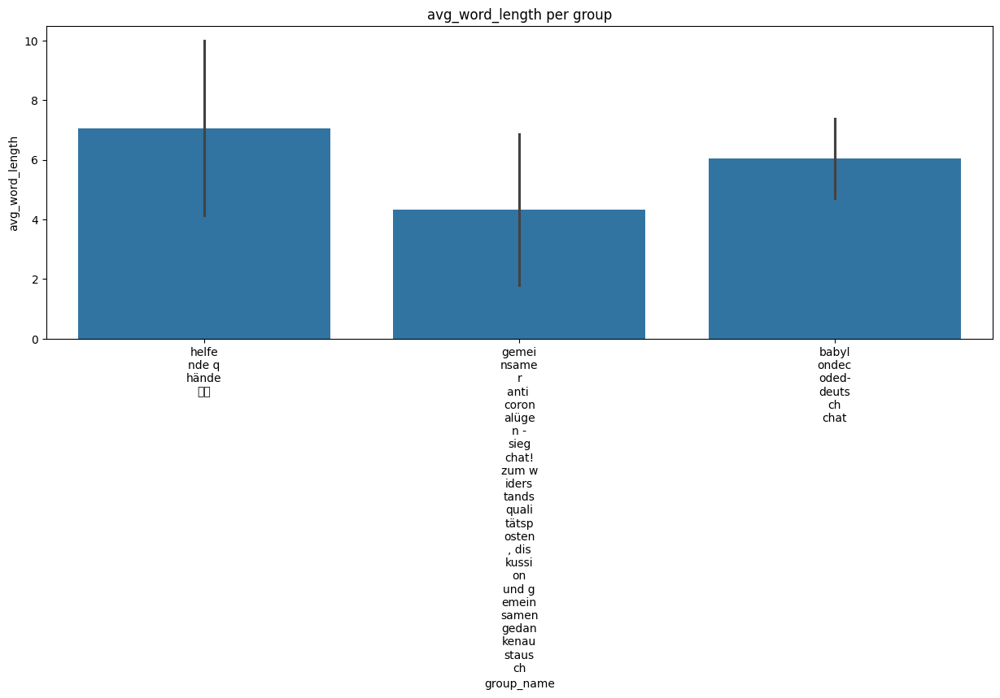

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


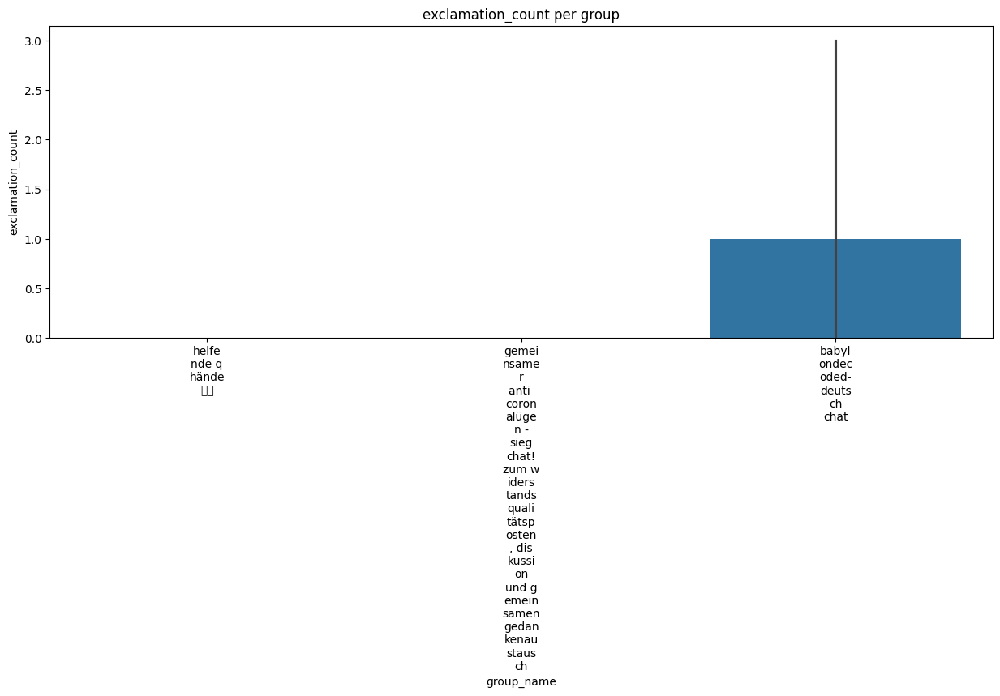

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


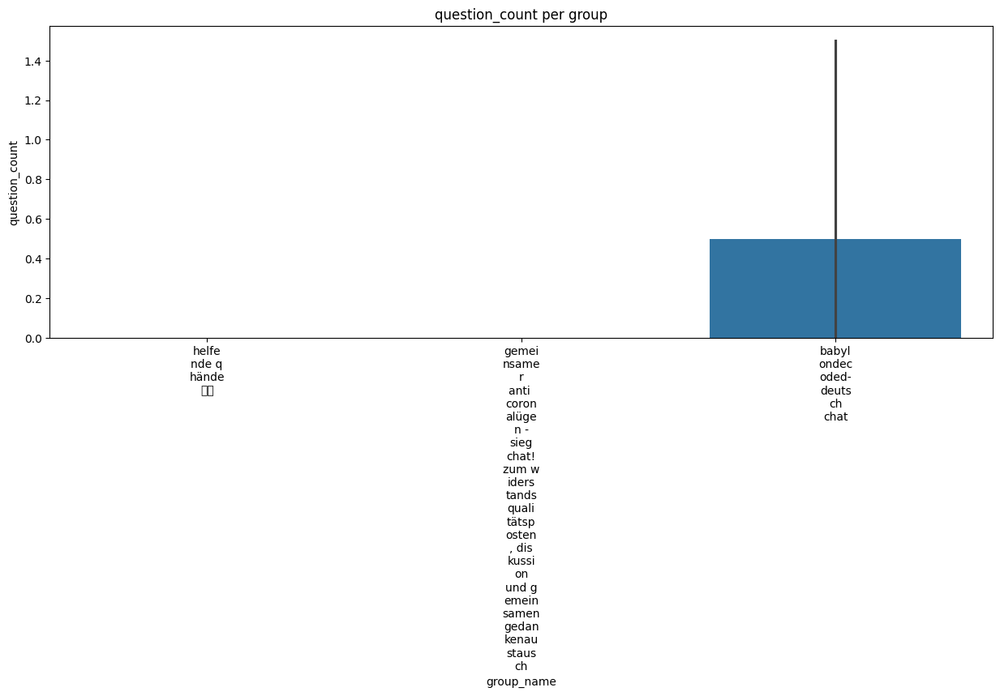

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


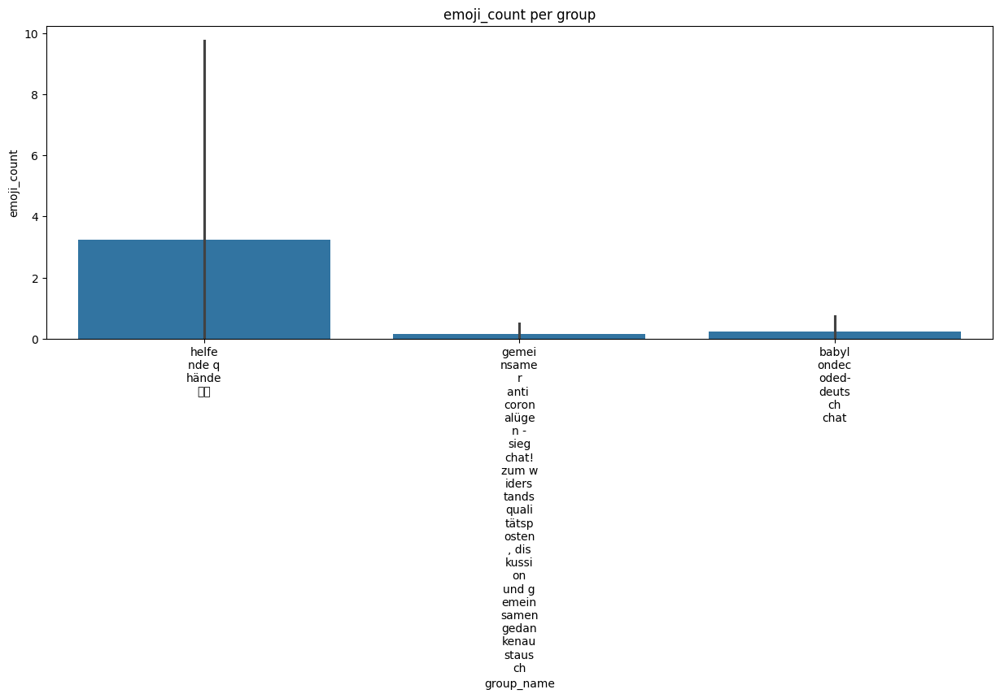

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


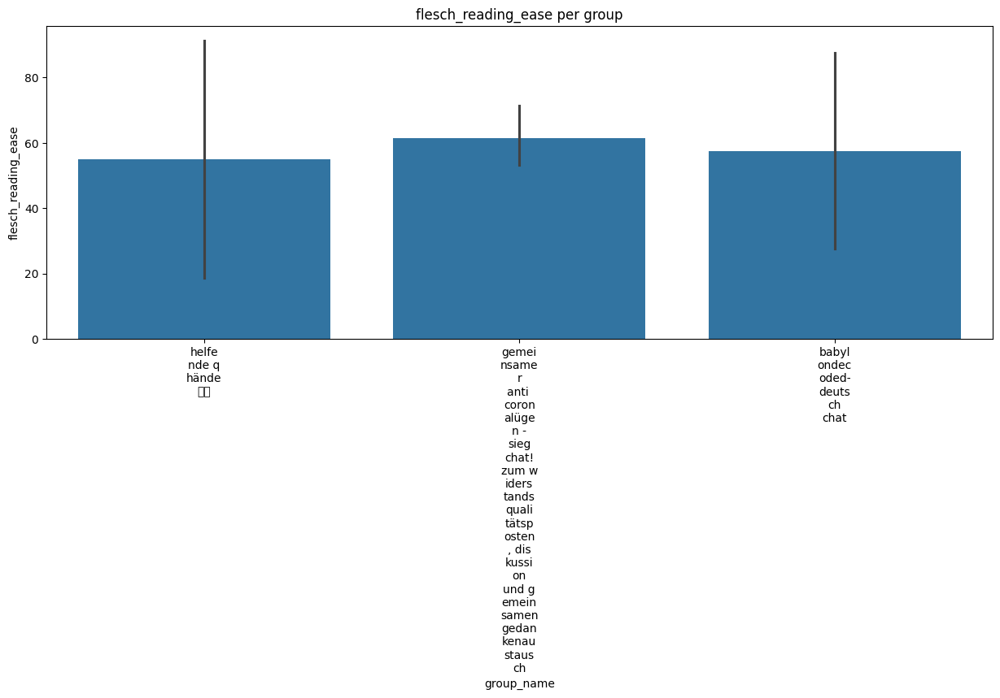

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


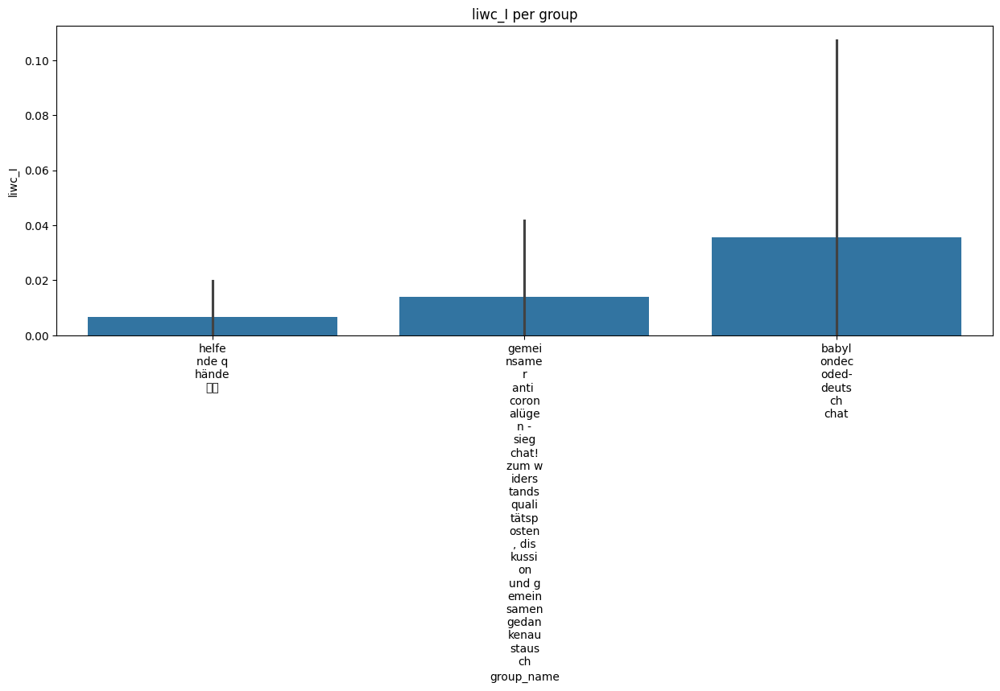

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


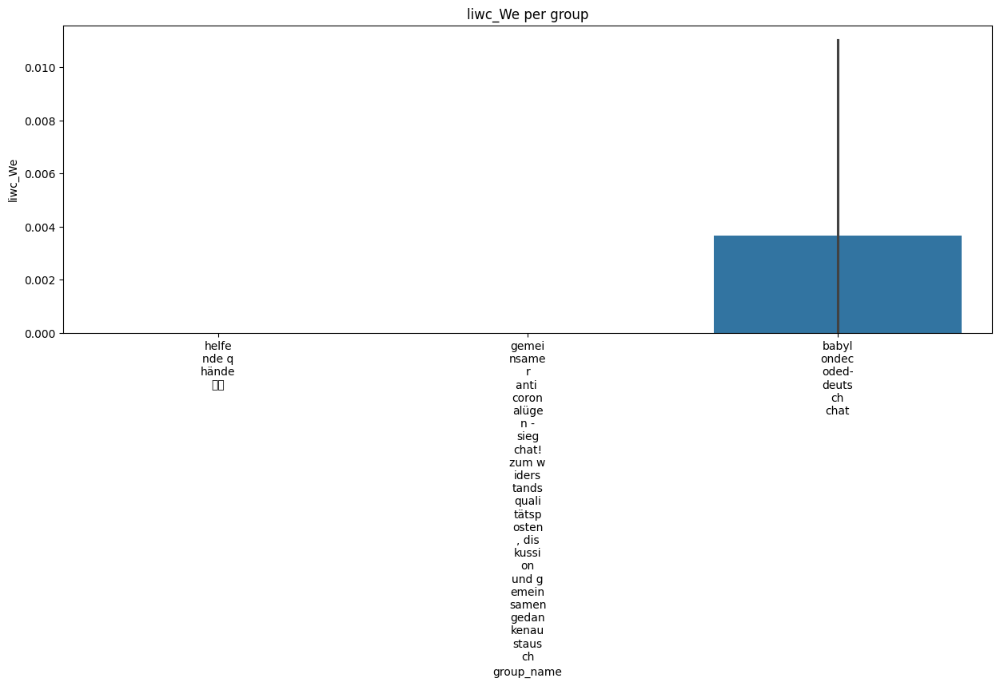

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


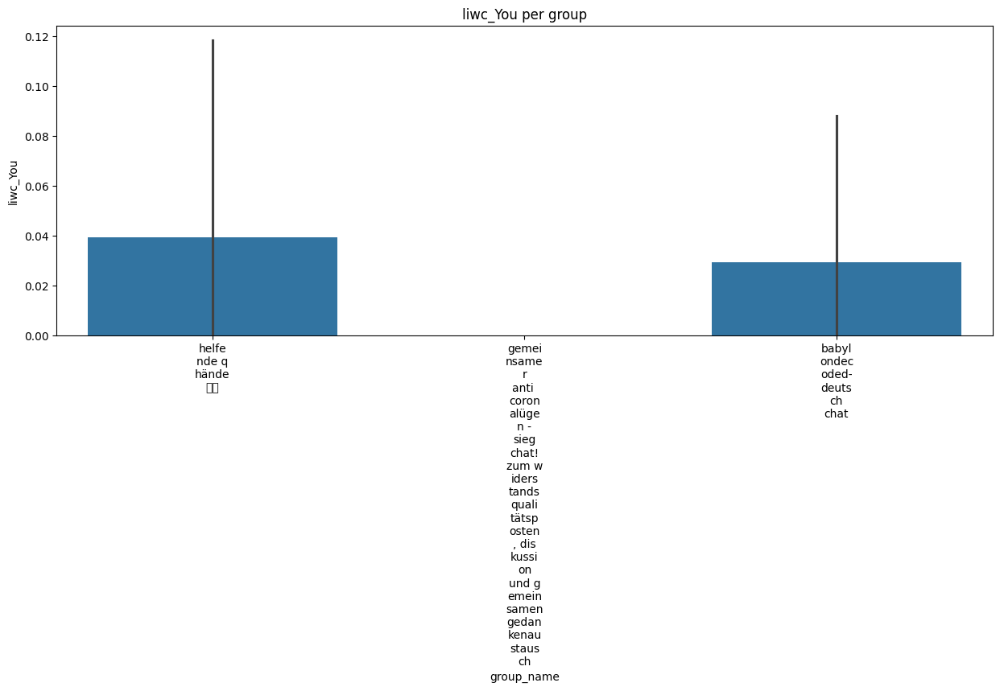

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


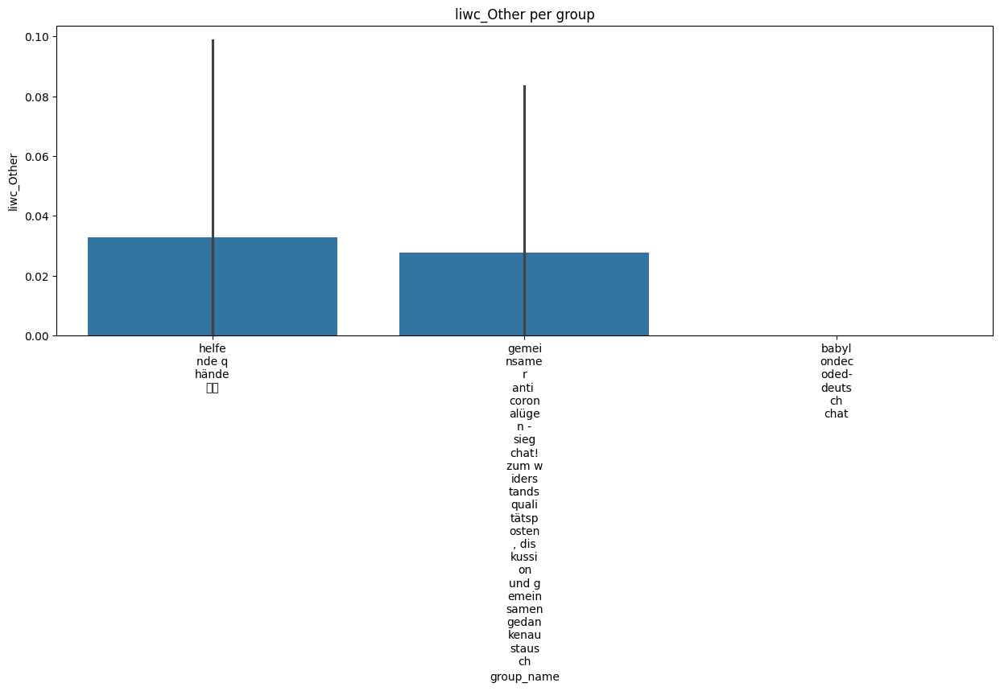

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


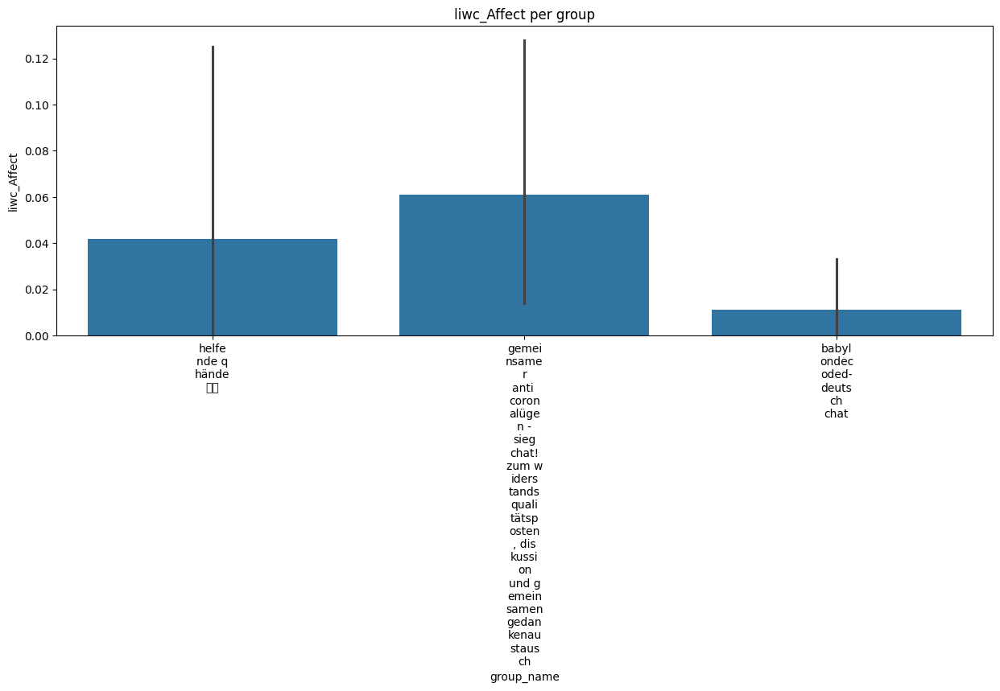

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


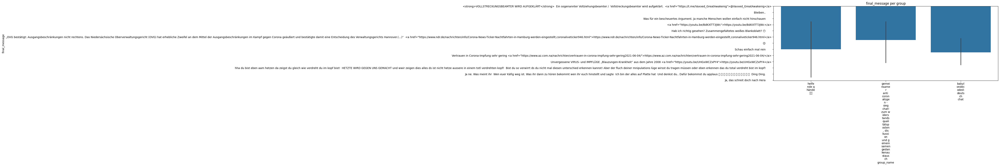

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


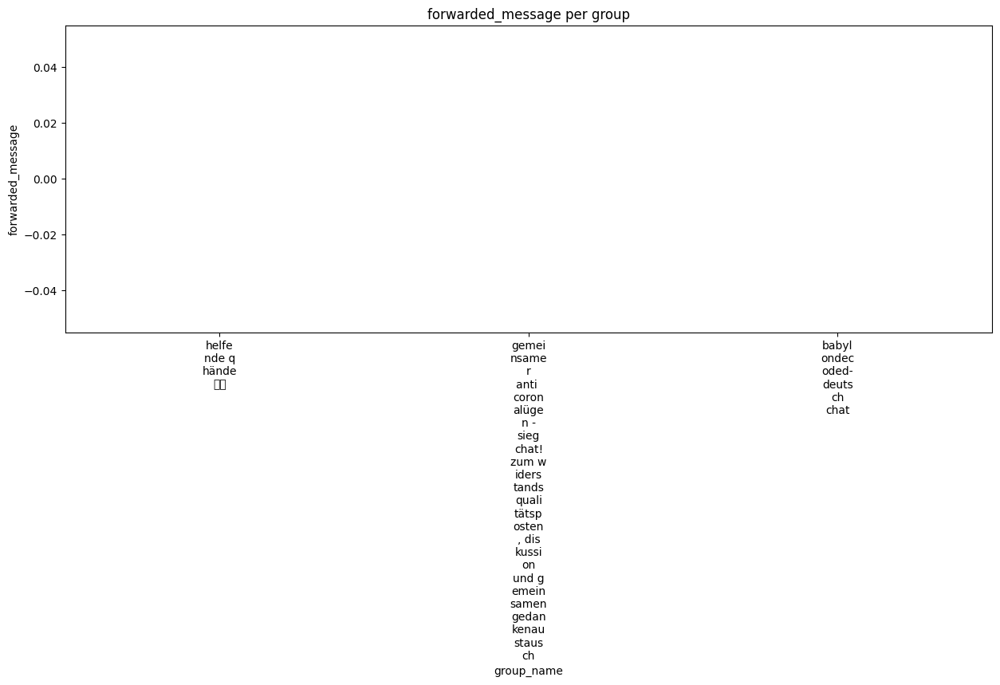

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


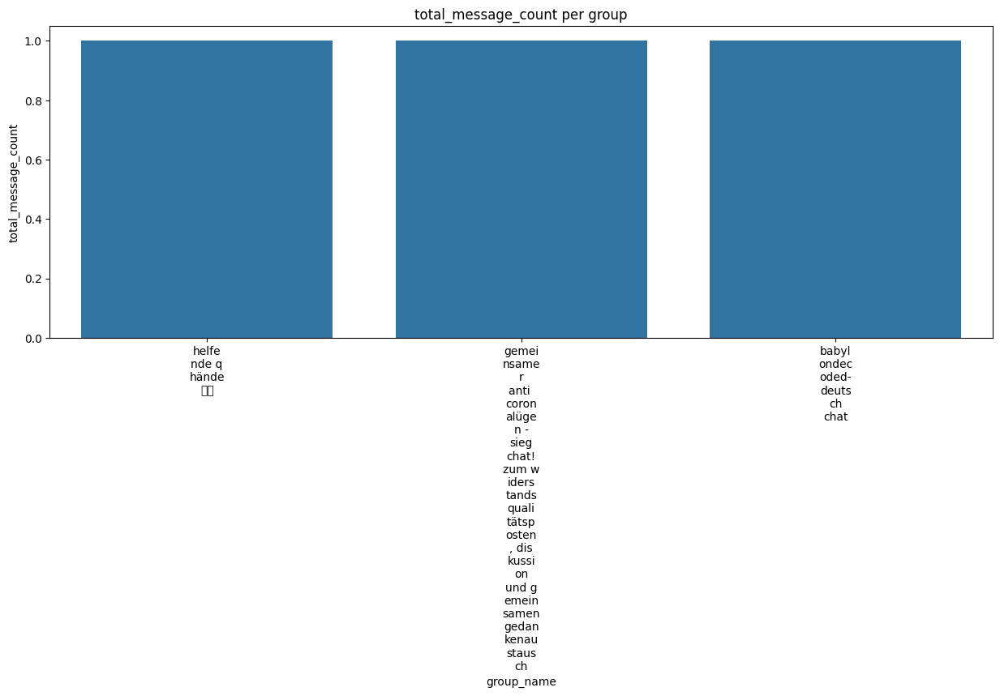

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


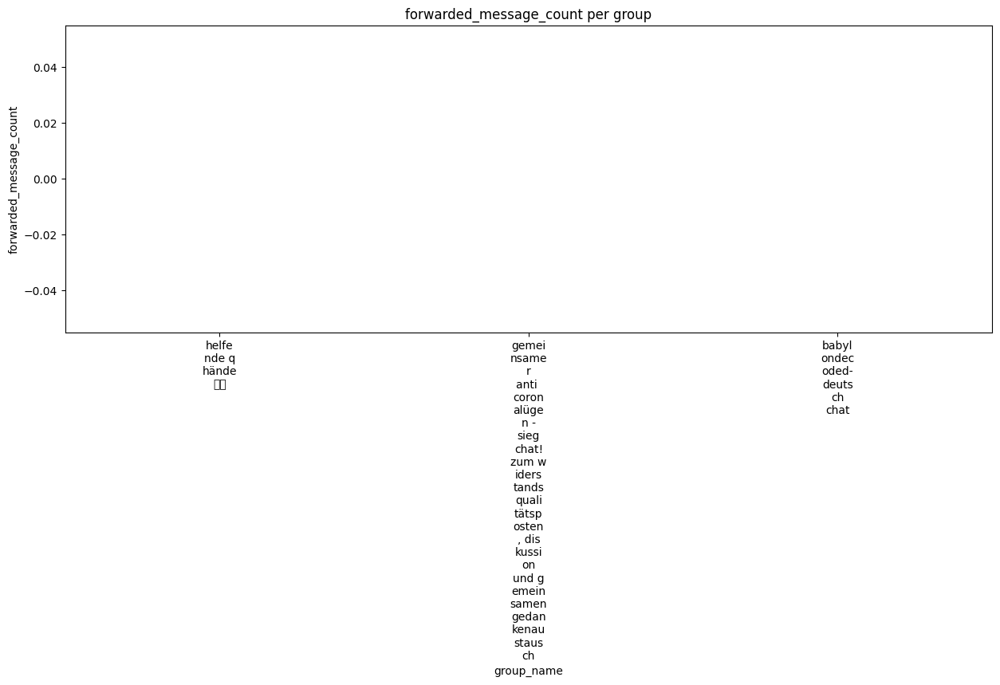

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


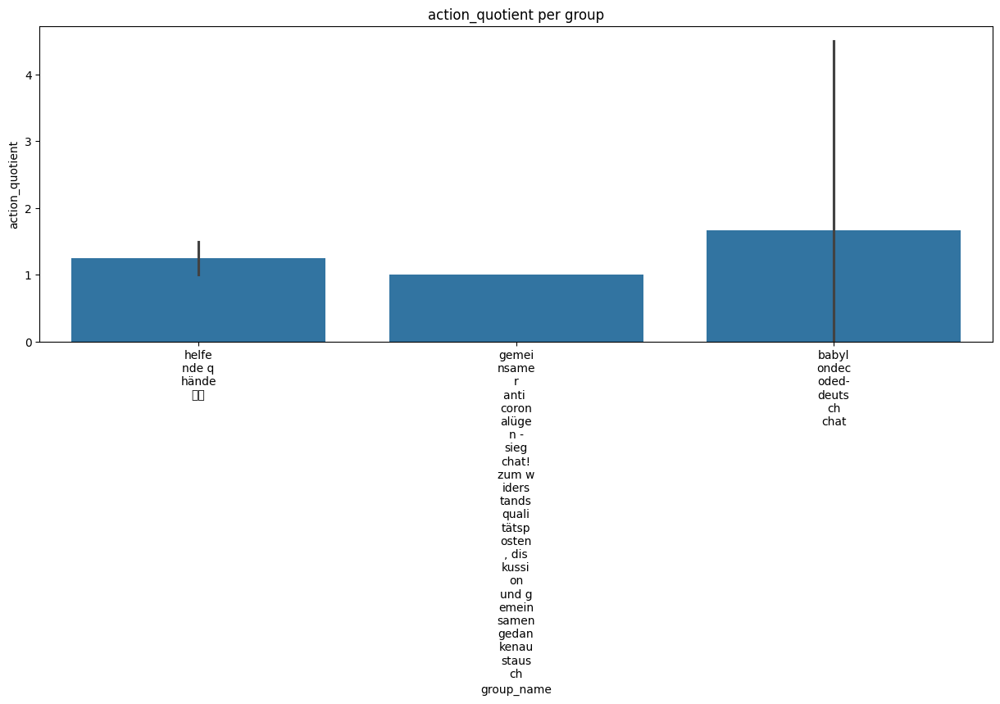

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_50538/1150114079.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)


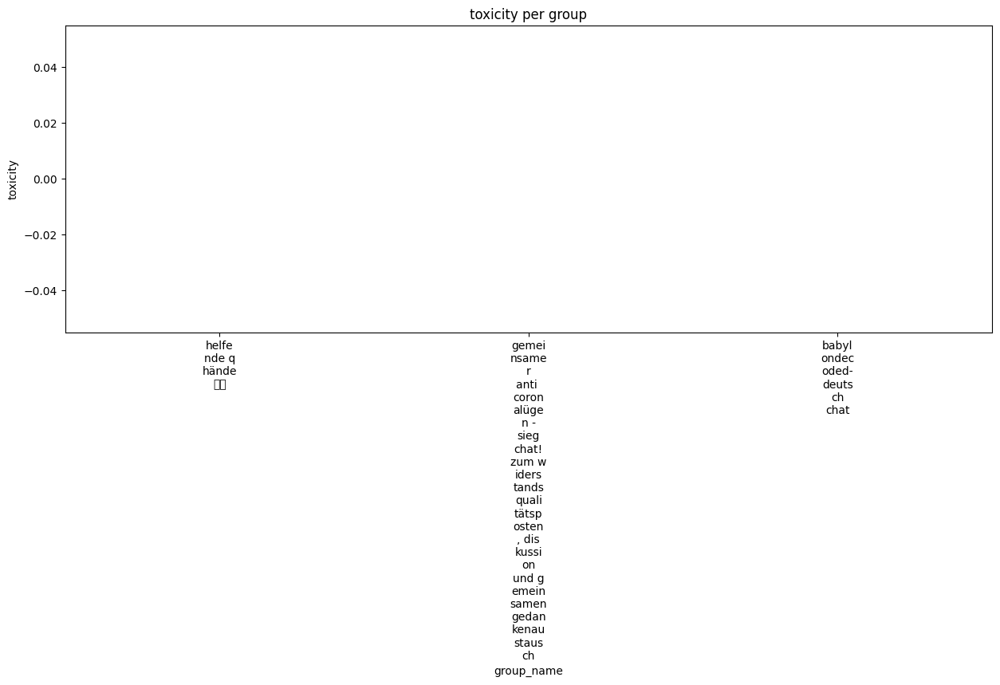

In [18]:
# Function to wrap labels
def wrap_labels(ax, width):
    labels = [textwrap.fill(label.get_text(), width) for label in ax.get_xticklabels()]
    ax.set_xticklabels(labels, rotation=0)

# Plot avg of columns per group
for col in features:
    plt.figure(figsize=(15, 5))
    ax = sns.barplot(data=selected_groups, x='group_name', y=col)
    wrap_labels(ax, 5)  
    plt.title(f'{col} per group')
    plt.show()

## Own vs. Forwarded Messages per Group

In [19]:
# aggregate pre_agg per group_name and count total, own and forwarded messages
group_message_count = pre_agg.groupby('group_name').agg({'UID_key': 'count', 'own_message': 'sum', 'forwarded_message': 'sum'}).reset_index()
# group_message_count['total_message_count'] = group_message_count['UID_key'].astype(int)
# group_message_count['own_message'] = group_message_count['own_message'].astype(int)
# group_message_count['forwarded_message'] = group_message_count['forwarded_message'].astype(int)

<Axes: >

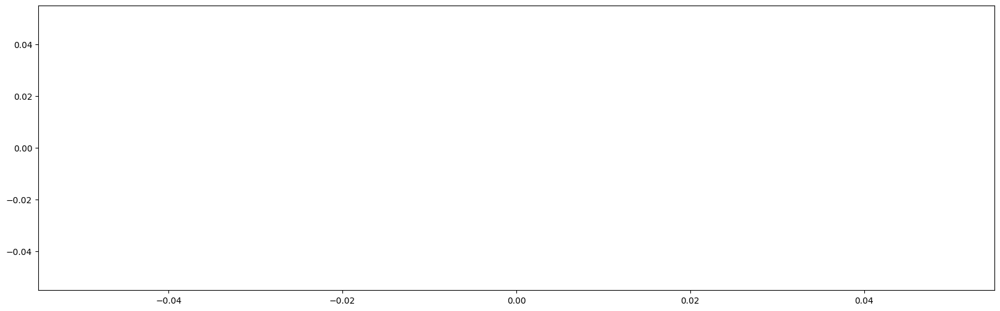

In [20]:
# scatterplot of own vs. forwarded messages
plt.figure(figsize=(20, 6))
sns.scatterplot(data=group_message_count, x='own_message', y='forwarded_message')

In [21]:
#convert to ratios
group_message_count['own_message_ratio'] = group_message_count['own_message'] / group_message_count['UID_key']
group_message_count['forwarded_message_ratio'] = group_message_count['forwarded_message'] / group_message_count['UID_key']

<Axes: >

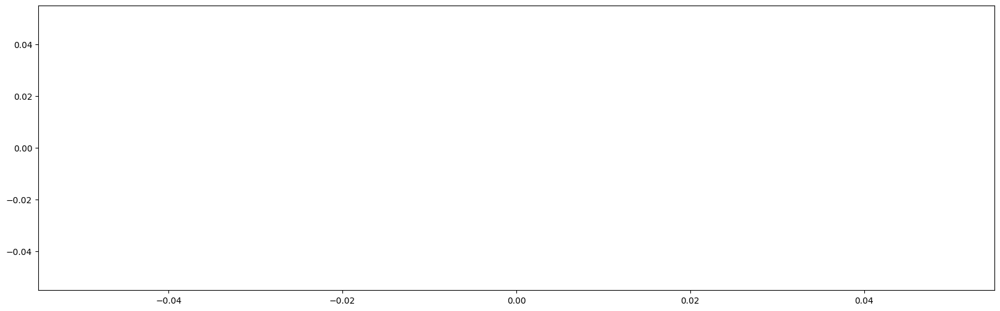

In [22]:
# scatterplot
plt.figure(figsize=(20, 6))
sns.scatterplot(data=group_message_count, x='own_message_ratio', y='forwarded_message_ratio')

# Channel vs. Group Messages

In [23]:
pre_agg.columns

Index(['UID_key', 'author', 'fwd_message', 'date', 'group_or_channel',
       'own_message', 'forwarded_message', 'group_name', 'fwd_message_string',
       'final_message', 'final_message_string', 'sent_count', 'word_count',
       'avg_sent_length', 'avg_word_length', 'exclamation_count',
       'question_count', 'emoji_count', 'noun_count', 'verb_count',
       'adj_count', 'flesch_reading_ease', 'flesch_reading_ease_class',
       'positive_sentiment', 'negative_sentiment', 'neutral_sentiment',
       'liwc_I', 'liwc_We', 'liwc_You', 'liwc_Other', 'liwc_Affect',
       'sentiment'],
      dtype='object')

In [24]:
pre_features = pre_agg.columns[5:7].append(pre_agg.columns[11:22].append(pre_agg.columns[26:]))
pre_features

Index(['own_message', 'forwarded_message', 'sent_count', 'word_count',
       'avg_sent_length', 'avg_word_length', 'exclamation_count',
       'question_count', 'emoji_count', 'noun_count', 'verb_count',
       'adj_count', 'flesch_reading_ease', 'liwc_I', 'liwc_We', 'liwc_You',
       'liwc_Other', 'liwc_Affect', 'sentiment'],
      dtype='object')

## KDE

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


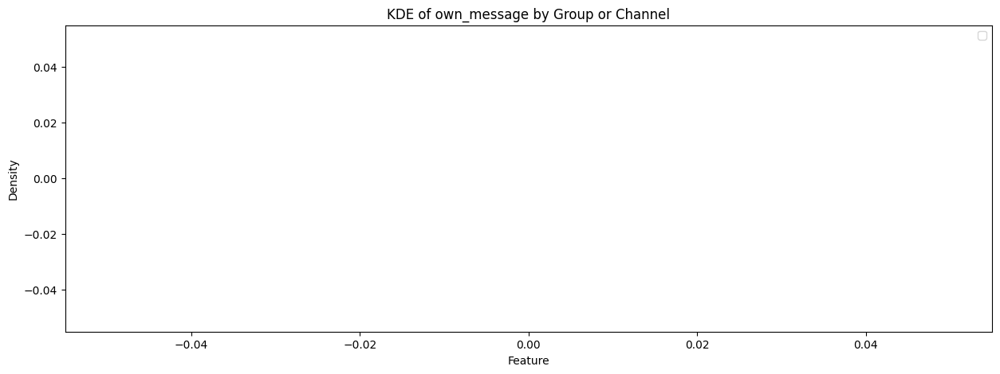

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


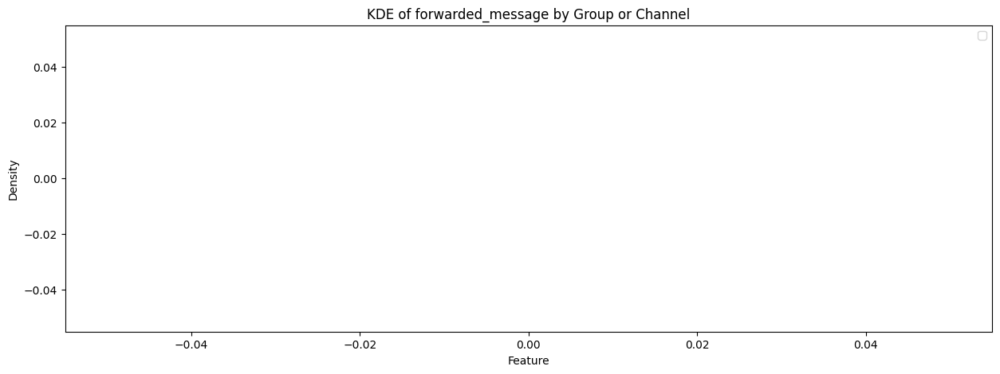

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


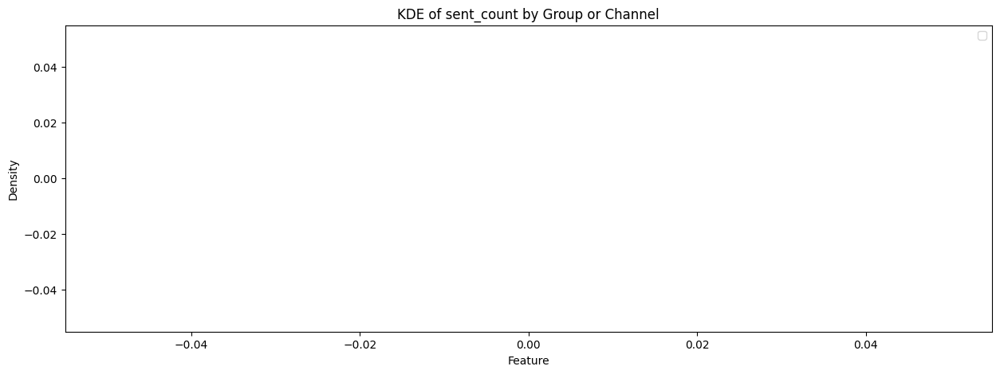

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


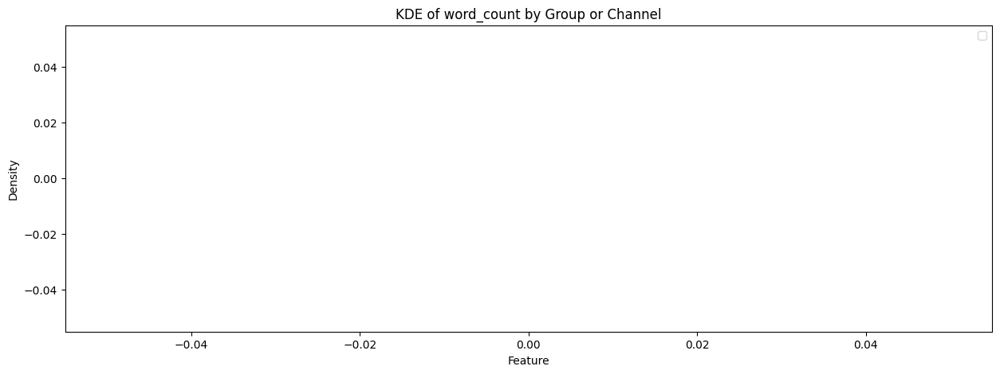

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


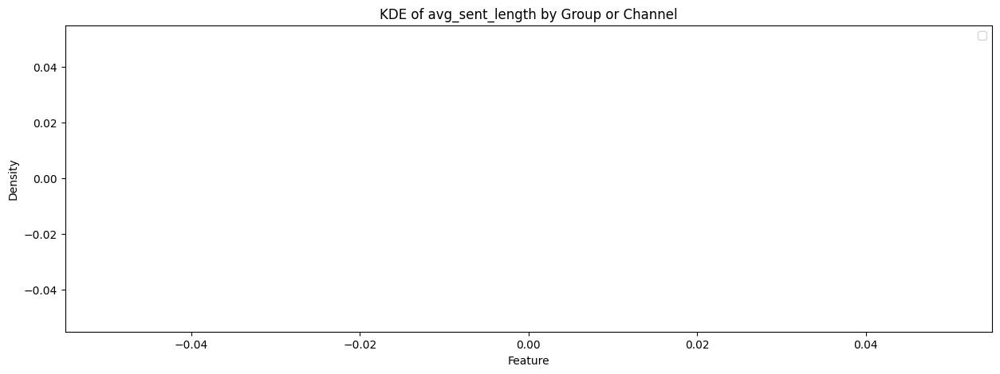

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


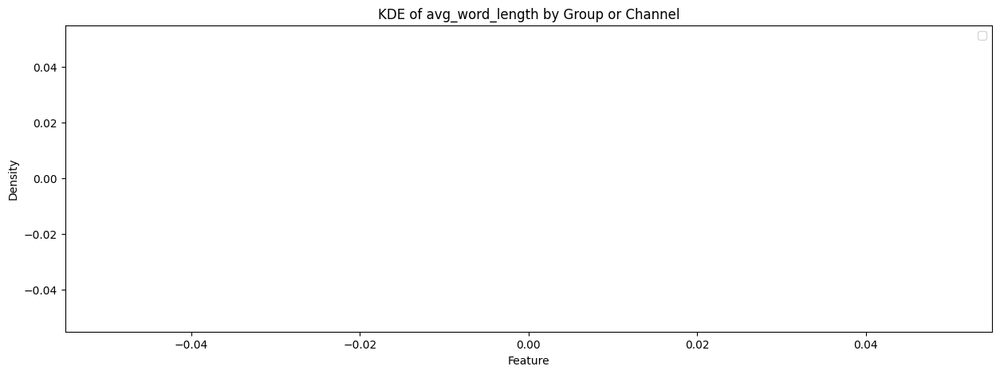

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


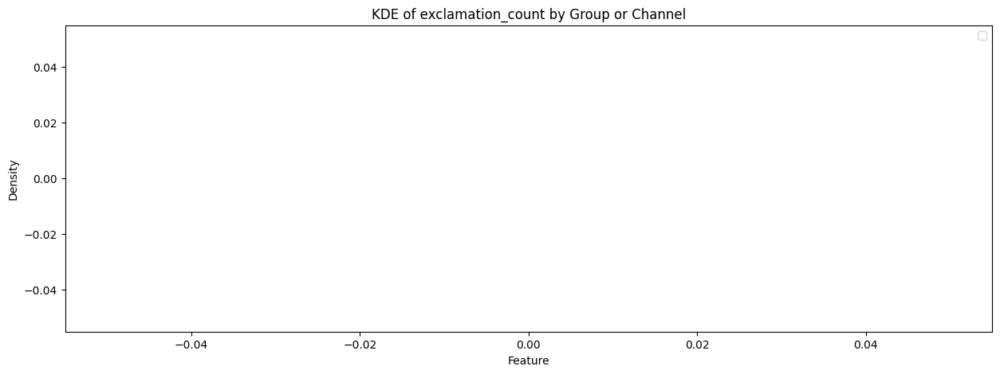

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


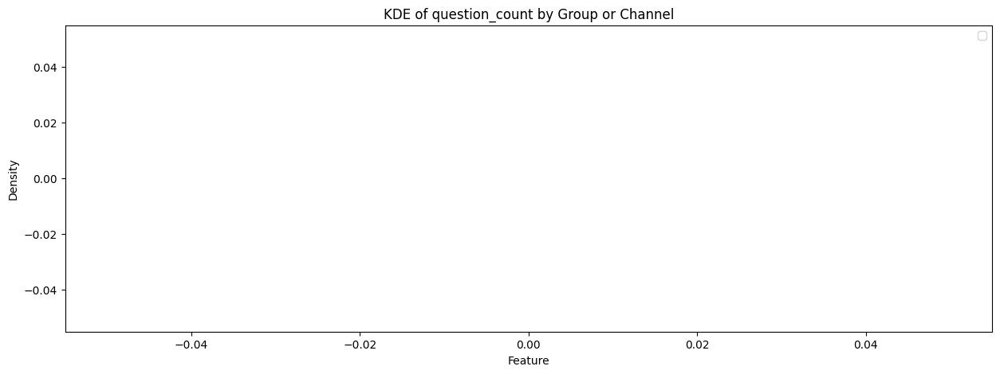

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


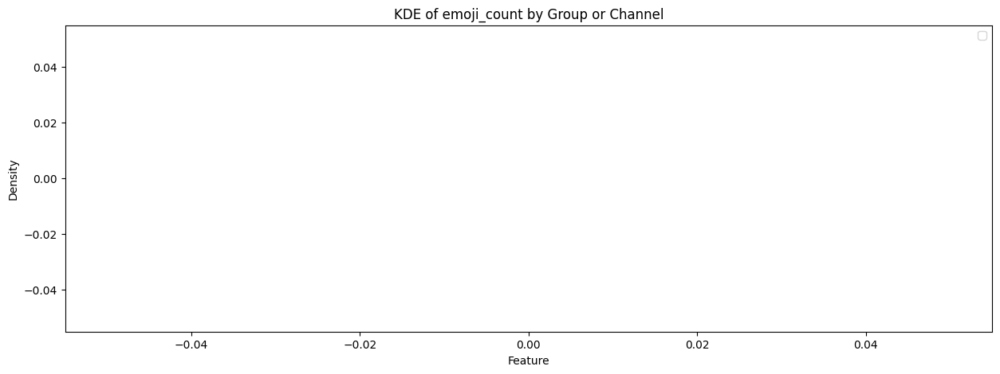

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


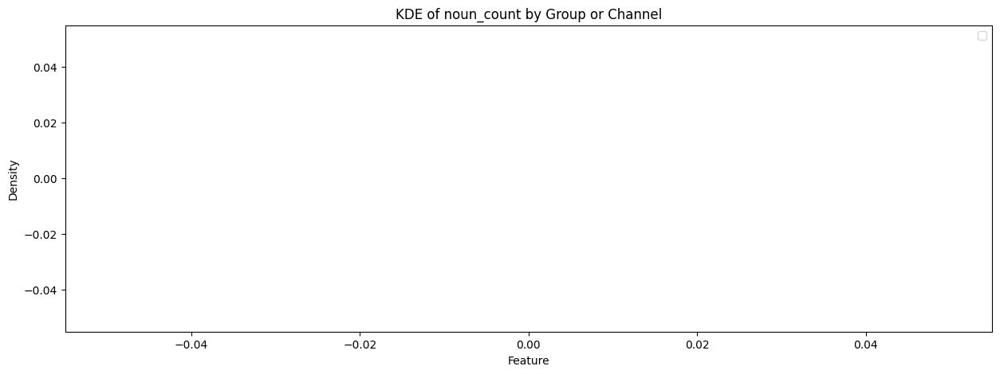

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


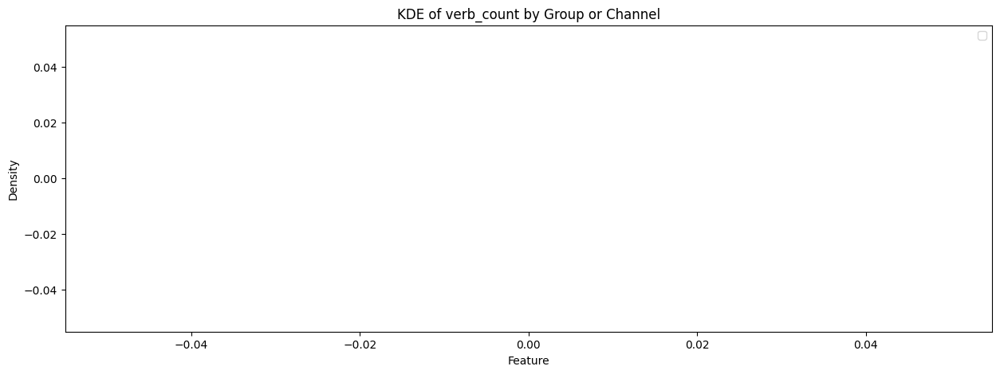

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


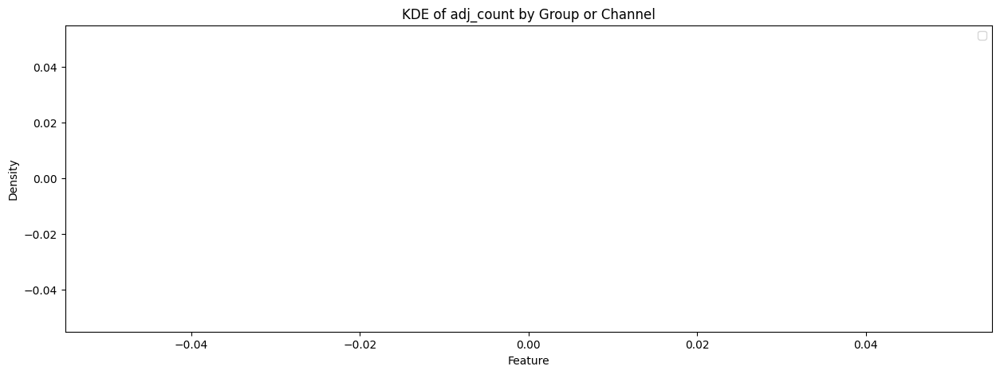

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


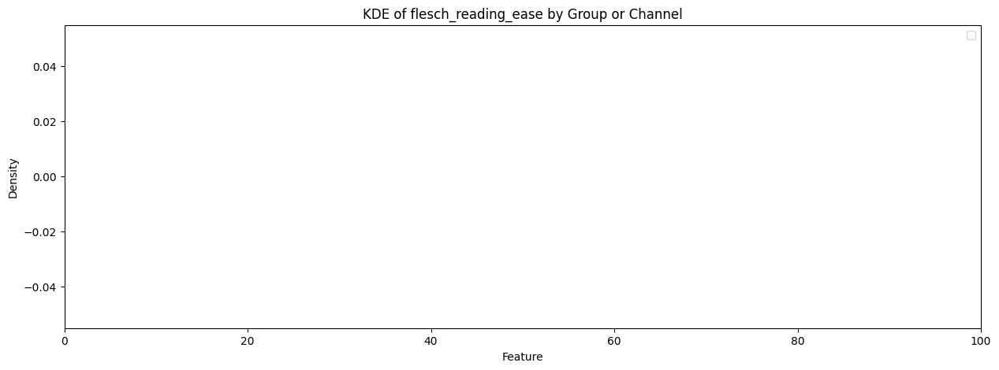

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


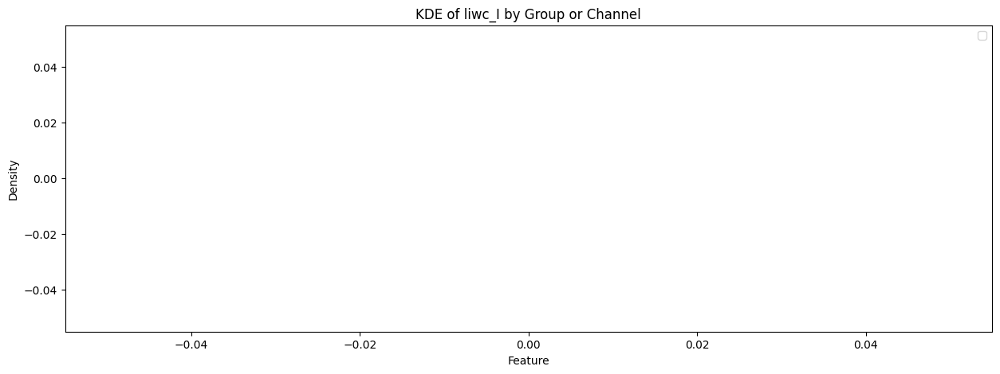

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


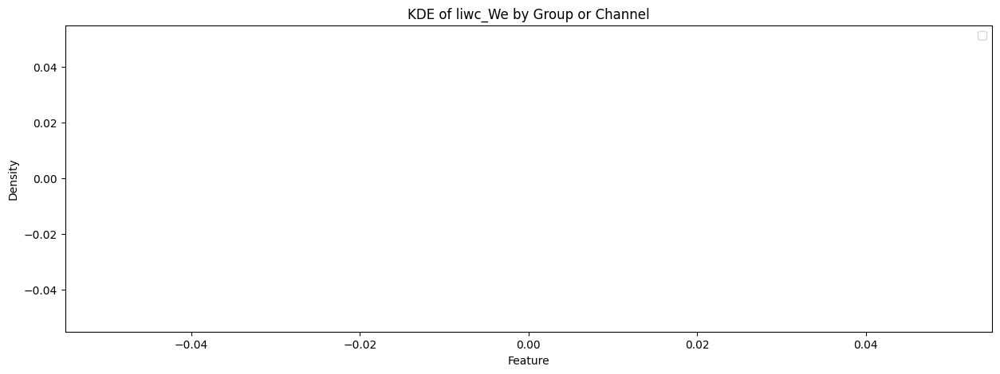

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


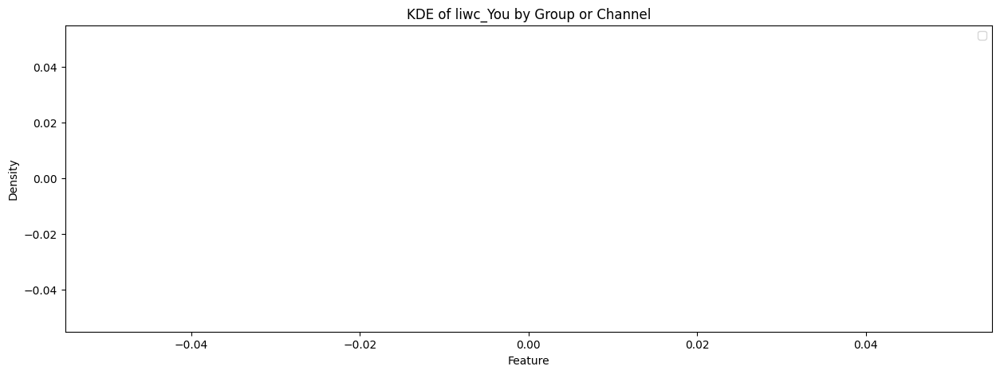

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


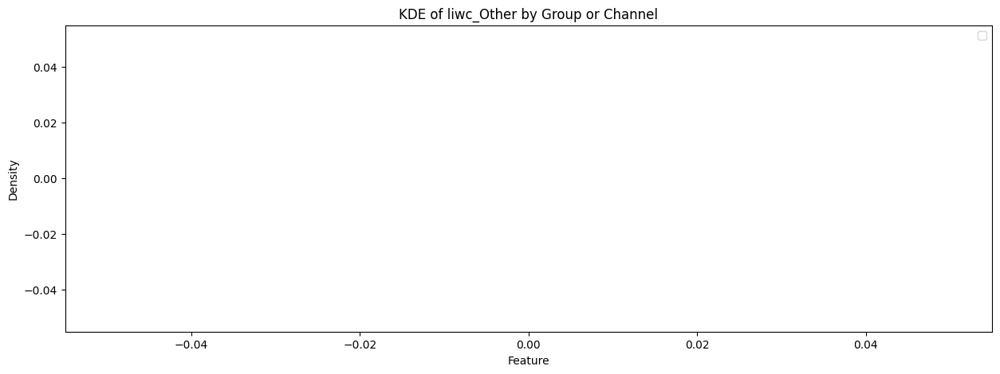

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


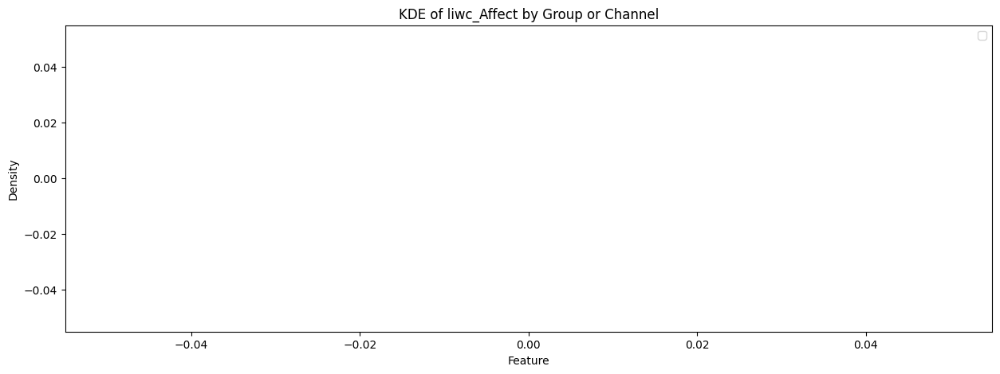

In [25]:
channels = plotting[plotting['group_or_channel'] == 'channel']
groups = plotting[plotting['group_or_channel'] == 'group']

#plot KDEs
for col in pre_features[:-1]:
    plt.figure(figsize=(15, 5))
    sns.kdeplot(channels[col], label='Channel', fill=True)
    sns.kdeplot(groups[col], label='Group', fill=True)
    plt.xlabel('Feature')
    plt.ylabel('Density')
    plt.title(f'KDE of {col} by Group or Channel')
    if col == 'flesch_reading_ease':
        plt.xlim(0,100)
    plt.legend()
    plt.show()

## Proportions

In [26]:
def plot_proportions(df, feature):
    proportions = df.groupby(['group_or_channel', feature]).size().unstack(fill_value=0)
    proportions = proportions.div(proportions.sum(axis=1), axis=0)
    proportions.T.plot(kind='bar', figsize=(10, 6), alpha=0.7)
    plt.title(f'Proportion of Messages by {feature}')
    plt.xlabel(feature)
    plt.ylabel('Proportion')
    plt.xticks(rotation=0)
    plt.legend(title='Message Type')
    plt.tight_layout()
    plt.show()

# Plot proportions for each feature
for feature in pre_features[:-1]:
    plot_proportions(plotting, feature)

TypeError: no numeric data to plot

## Selected Features

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_40044/3302940331.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  flesch_plot['flesch_reading_ease_class'] = pd.Categorical(flesch_plot['flesch_reading_ease_class'], categories=label_order[:-1], ordered=True)
/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_40044/3302940331.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  flesch_plot = flesch_plot.groupby(['group_or_channel', 'flesch_reading_ease_class']).size().unstack(fill_value=0)


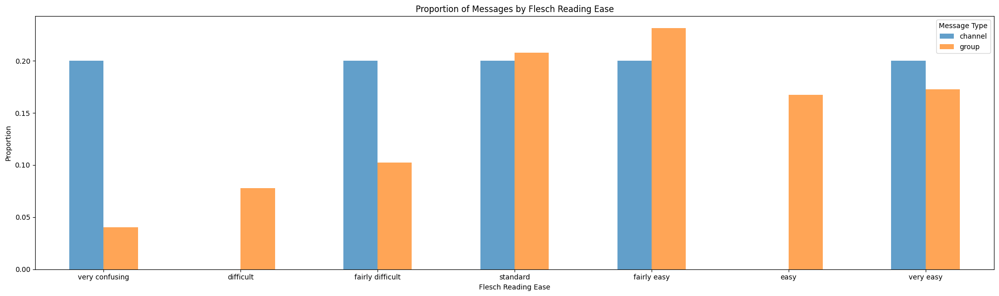

In [ ]:
# plot only flesch reading ease
label_order = ['very confusing', 'difficult', 'fairly difficult', 'standard', 'fairly easy', 'easy', 'very easy', 'unclassified']
flesch_plot = plotting[plotting['flesch_reading_ease_class'] != 'unclassified']
flesch_plot['flesch_reading_ease_class'] = pd.Categorical(flesch_plot['flesch_reading_ease_class'], categories=label_order[:-1], ordered=True)
flesch_plot = flesch_plot.groupby(['group_or_channel', 'flesch_reading_ease_class']).size().unstack(fill_value=0)
flesch_plot = flesch_plot.div(flesch_plot.sum(axis=1), axis=0)
flesch_plot.T.plot(kind='bar', figsize=(20, 6), alpha=0.7)
plt.title('Proportion of Messages by Flesch Reading Ease')
plt.xlabel('Flesch Reading Ease')
plt.ylabel('Proportion')
plt.xticks(rotation=0)
plt.legend(title='Message Type')
plt.tight_layout()
plt.show()

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_40044/1799237371.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plotting['sentiment'] = pd.Categorical(plotting['sentiment'], categories=label_order, ordered=True)
/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_40044/1799237371.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plotting = plotting.groupby(['group_or_channel', 'sentiment']).size().unstack(fill_value=0)


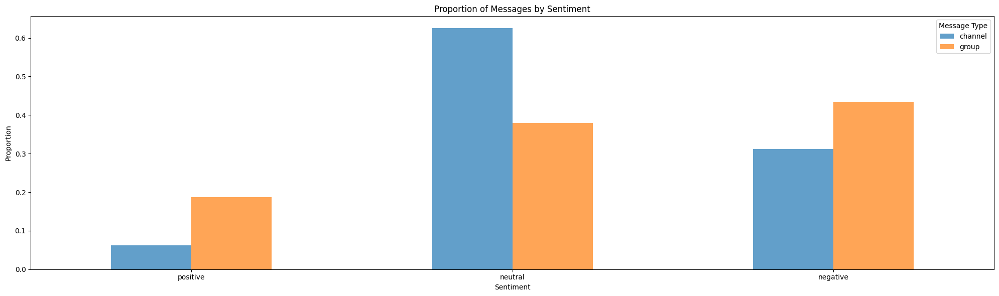

In [ ]:
# plot only flesch reading ease
label_order = ['positive', 'neutral', 'negative']
plotting['sentiment'] = pd.Categorical(plotting['sentiment'], categories=label_order, ordered=True)
plotting = plotting.groupby(['group_or_channel', 'sentiment']).size().unstack(fill_value=0)
plotting = plotting.div(plotting.sum(axis=1), axis=0)
plotting.T.plot(kind='bar', figsize=(20, 6), alpha=0.7)
plt.title('Proportion of Messages by Sentiment')
plt.xlabel('Sentiment')
plt.ylabel('Proportion')
plt.xticks(rotation=0)
plt.legend(title='Message Type')
plt.tight_layout()
plt.show()

# Own vs.Forwarded Messages

Text(0.5, 1.0, 'Own vs. Forwarded Messages')

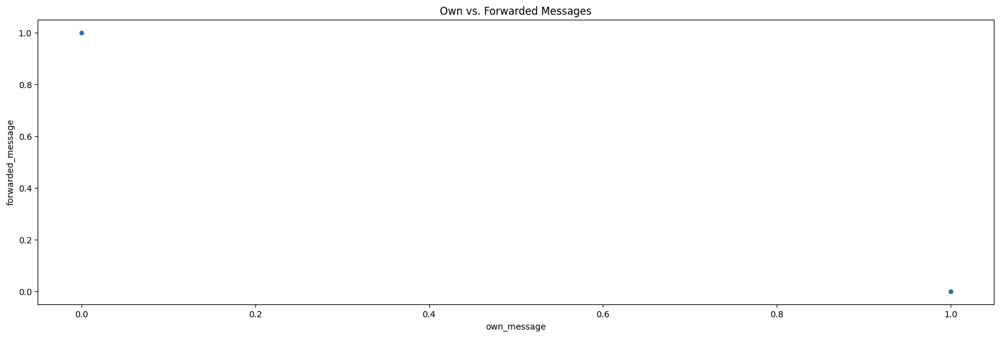

In [ ]:
# scatter plot of own vs. forwarded messages
plt.figure(figsize=(20, 6)) 
sns.scatterplot(data=post_agg_author, x='own_message', y='forwarded_message')
plt.title('Own vs. Forwarded Messages')

In [ ]:
post_agg_author[(post_agg_author['own_message'] != 0) & (post_agg_author['forwarded_message'] != 0)]

,author,noun_count,verb_count,adj_count,positive_sentiment,negative_sentiment,neutral_sentiment,channel_messages,group_messages,sent_count,...,final_message_string,own_message,forwarded_message,total_message_count,own_message_count,forwarded_message_count,action_quotient,sentiment_quotient,avg_flesch_reading_ease_class,toxicity


# LIWC Features

<Figure size 1000x800 with 0 Axes>

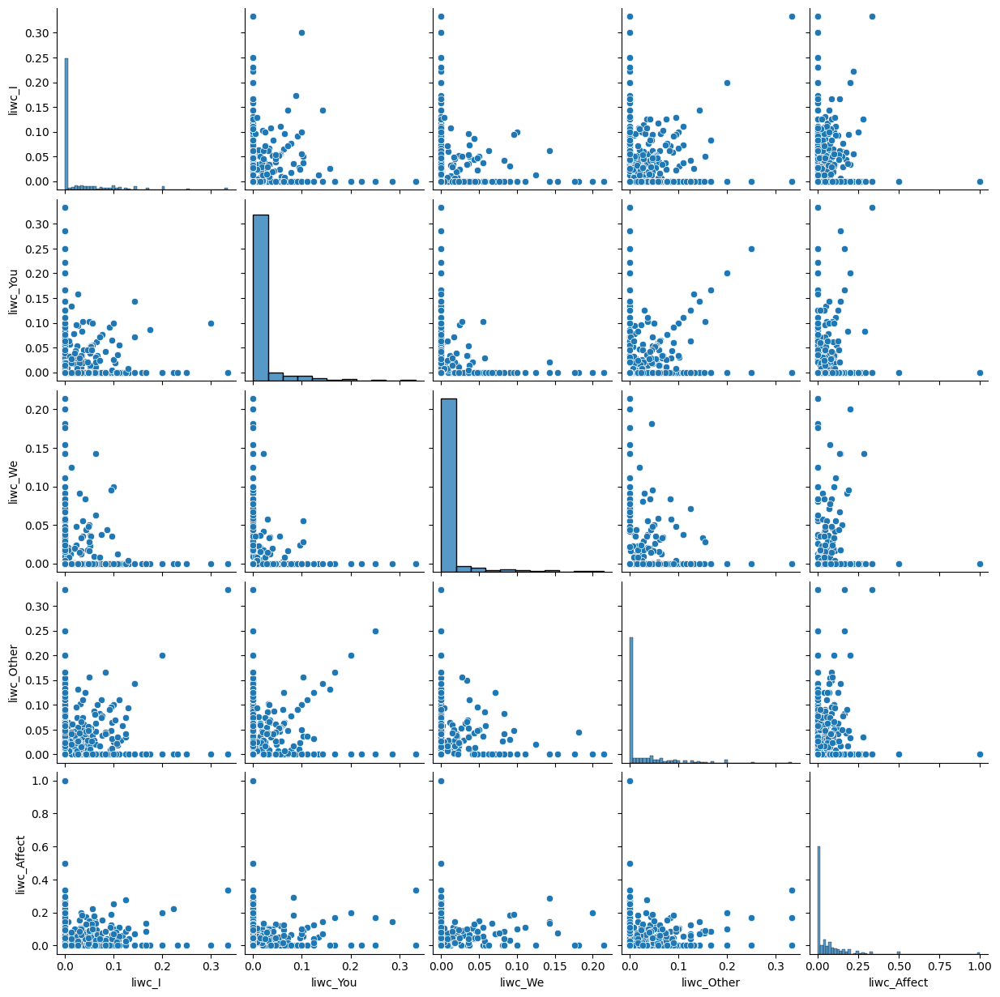

In [ ]:
liwc = post_agg_author[['liwc_I', 'liwc_You', 'liwc_We', 'liwc_Other', 'liwc_Affect']]
liwc = liwc.dropna(how='all')

# Plot 
plt.figure(figsize=(10, 8))
sns.pairplot(liwc)

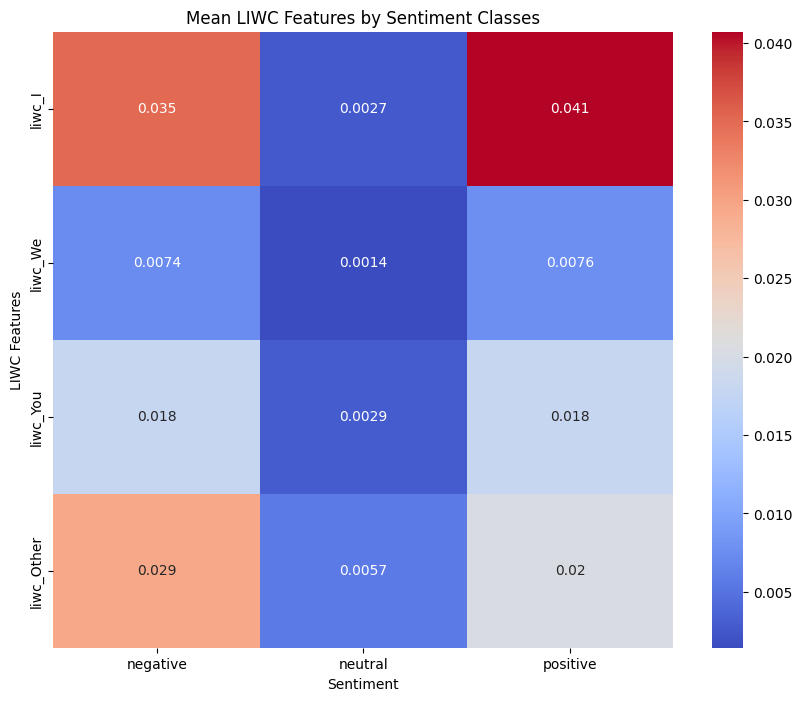

In [ ]:
# Calculate the mean of each feature per sentiment class
mean_values = pre_agg[['liwc_I', 'liwc_We', 'liwc_You', 'liwc_Other', 'sentiment']].groupby('sentiment').mean().T

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(mean_values, annot=True, cmap='coolwarm')
plt.title('Mean LIWC Features by Sentiment Classes')
plt.xlabel('Sentiment')
plt.ylabel('LIWC Features')
plt.show()

# PCA

In [ ]:
#drop columns that are not features
features = post_agg_author.drop(['author','final_message', 'final_message_string', 'avg_flesch_reading_ease_class'], axis=1)
features = features.fillna(features.mean())

#standardize features
scaler = StandardScaler()
features = scaler.fit_transform(features)

In [ ]:
# Find optimal number of components using the Elbow Method
explained_variance = []
num_features = features.shape[1]

for i in range(1, num_features + 1):
    pca = PCA(n_components=i)
    pca.fit(features)
    explained_variance.append(np.sum(pca.explained_variance_ratio_))

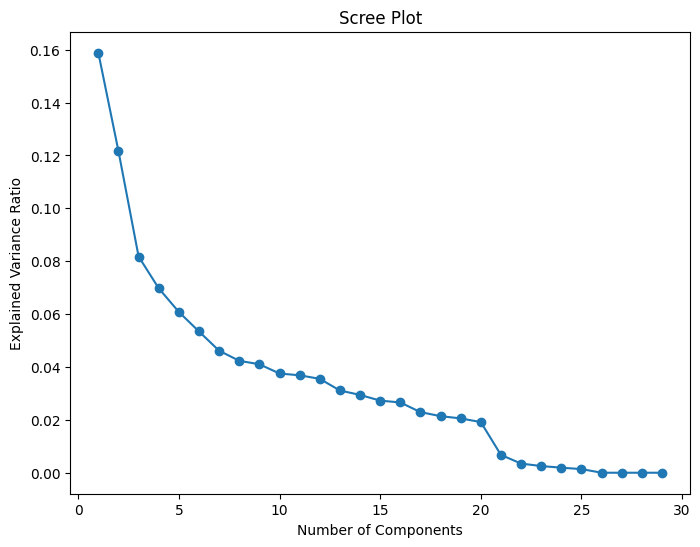

In [ ]:
#plot a scree plot instead
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, marker='o')
plt.title('Scree Plot')
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance Ratio')
plt.show()

In [ ]:
#perform PCA to two components
pca = PCA(n_components=4)
pca_transformed = pca.fit_transform(features)

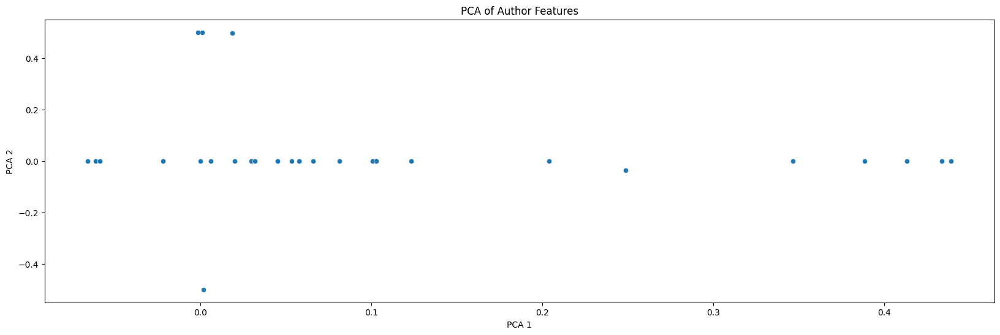

In [ ]:
#plot PCA
plt.figure(figsize=(20, 6))
sns.scatterplot(x=pca.components_[0], y=pca.components_[1])
plt.title('PCA of Author Features')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()